In [1]:
# Functional imports
import os 
import numpy as np
import nibabel as nib
from nilearn import plotting
from nilearn.image import coord_transform
from nilearn import datasets

from data_prep_helpers import make_vol, make_boolean_mask
from plotting_helpers import plot_lateral_only, plot_surfaces_with_vmax, plot_surfaces_with_vmax, plot_medial_with_vmax

# Notebook specific imports
import warnings
import sys 
if not sys.warnoptions:
    warnings.simplefilter("ignore")
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
%autosave 5

/home/imelizabeth/.conda/envs/cloudy2/lib/python3.6/site-packages/nilearn/__init__.py:69: FutureWarning: Python 3.6 support is deprecated and will be removed in release 0.10 of Nilearn. Consider switching to Python 3.8 or 3.9.
  _python_deprecation_warnings()


Autosaving every 5 seconds


In [2]:
# Set data location
directory = os.path.join(os.path.expanduser('~'), 'data-lisik3', 'imelizabeth', 'partly_cloudy-main', 'data')
print('Data location:', directory)

# Load masks
mask = nib.load(os.path.join(directory, 'adult_isc_mask.nii.gz'))
print('Mask:', np.shape(mask))

Data location: /home/imelizabeth/data-lisik3/imelizabeth/partly_cloudy-main/data
Mask: (79, 95, 68)


<h1>Significant voxels</h1>
<p>Set up dataframe</h1>

In [5]:

data = {'Age group': ['3-4 yrs', '5 yrs', '7 yrs', '8-12 yrs', 'adults'], 
       'Full scores': [133428, 132920, 132517, 134687, 132867],
       'Motion energy scores': [131713, 131560, 130184, 133247, 131768],
       'Social scores': [93134, 90691, 80697, 112079, 102693],
       'Faces scores': [574, 1683, 7622, 8573, 11159],
       'Interaction scores': [0, 3937, 3865, 10763, 10742],
        'ToM scores' : [0, 0, 0, 3226, 5306]
      }
significance_df = pd.DataFrame(data)

print(significance_df)

  Age group  Full scores  Motion energy scores  Social scores  Faces scores  \
0   3-4 yrs       133428                131713          93134           574   
1     5 yrs       132920                131560          90691          1683   
2     7 yrs       132517                130184          80697          7622   
3  8-12 yrs       134687                133247         112079          8573   
4    adults       132867                131768         102693         11159   

   Interaction scores  ToM scores  
0                   0           0  
1                3937           0  
2                3865           0  
3               10763        3226  
4               10742        5306  


In [6]:

data = {'Age group': ['3-4 yrs', '5 yrs', '7 yrs', '8-12 yrs', 'adults'], 
       'Full scores': [(133428/377996), (132920/377996), (132517/377996), (134687/377996), (132867/377996)],
       'Motion energy scores': [(131713/377996), (131560/377996), (130184/377996), (133247/377996), (131768/377996)],
       'Social scores': [(93134/377996), (90691/377996), (80697/377996), (112079/377996), (102693/377996)],
       'Faces scores': [(574/377996), (1683/377996), (7622/377996), (8573/377996), (11159/377996)],
       'Interaction scores': [(0/377996), (3937/377996), (3865/377996), (10763/377996), (10742/377996)],
        'ToM scores' : [ (0/377996),(0/377996), (0/377996), (3226/377996), (5306/377996)]
      }
significance_percent_df = pd.DataFrame(data)

print(significance_percent_df)

  Age group  Full scores  Motion energy scores  Social scores  Faces scores  \
0   3-4 yrs     0.352988              0.348451       0.246389      0.001519   
1     5 yrs     0.351644              0.348046       0.239926      0.004452   
2     7 yrs     0.350578              0.344406       0.213486      0.020164   
3  8-12 yrs     0.356319              0.352509       0.296508      0.022680   
4    adults     0.351504              0.348596       0.271677      0.029521   

   Interaction scores  ToM scores  
0            0.000000    0.000000  
1            0.010415    0.000000  
2            0.010225    0.000000  
3            0.028474    0.008534  
4            0.028418    0.014037  


<h1>Full brains</h1>
<p>Thresholded, unthresholded, and # significant voxels</p>

In [3]:
# Load unthresholded results
full_scores_34yrs_unthresholded = np.mean(np.load(os.path.join(
    directory, '3-4-yrs', 'encoding_results','unthresholded_whole', '3-4-yrs_full_scores_adult_isc_mask.npy')), axis=0)

full_scores_5yrs_unthresholded = np.mean(np.load(os.path.join(
    directory, '5-yrs', 'encoding_results','unthresholded', '5-yrs_full_scores_adult_isc_mask.npy')), axis=0)

full_scores_7yrs_unthresholded = np.mean(np.load(os.path.join( 
    directory, '7-yrs', 'encoding_results','unthresholded', '7-yrs_full_scores_adult_isc_mask.npy')), axis=0)

full_scores_812yrs_unthresholded = np.mean(np.load(os.path.join(
    directory, '8-12-yrs', 'encoding_results','unthresholded', '8-12-yrs_full_scores_adult_isc_mask.npy')), axis=0)

full_scores_adults_unthresholded = np.mean(np.load(os.path.join(
    directory, 'adults','encoding_results', 'unthresholded', 'adults_full_scores_adult_isc_mask.npy')), axis=0)


# Load thresholded scores
full_scores_34yrs_thresholded = np.load(os.path.join(
    directory, '3-4-yrs', 'encoding_results','thresholded_whole', '3-4-yrs_full_scores_adult_isc_mask_thresholded05.npy'))

full_scores_5yrs_thresholded = np.load(os.path.join(
    directory, '5-yrs','encoding_results', 'thresholded', '5-yrs_full_scores_adult_isc_mask_thresholded05.npy'))

full_scores_7yrs_thresholded = np.load(os.path.join(
    directory, '7-yrs', 'encoding_results','thresholded', '7-yrs_full_scores_adult_isc_mask_thresholded05.npy'))

full_scores_812yrs_thresholded = np.load(os.path.join(
    directory, '8-12-yrs', 'encoding_results','thresholded', '8-12-yrs_full_scores_adult_isc_mask_thresholded05.npy'))

full_scores_adults_thresholded = np.load(os.path.join(
    directory, 'adults', 'encoding_results','thresholded', 'adults_full_scores_adult_isc_mask_thresholded05.npy'))

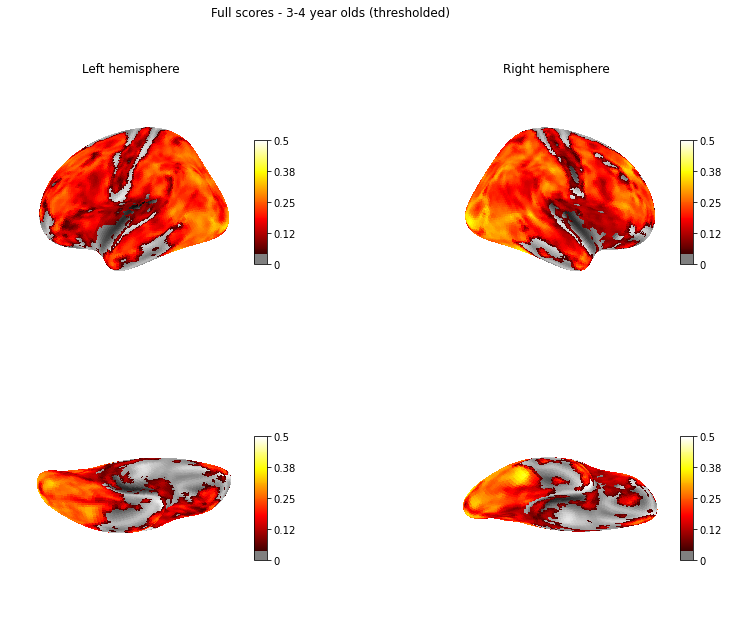

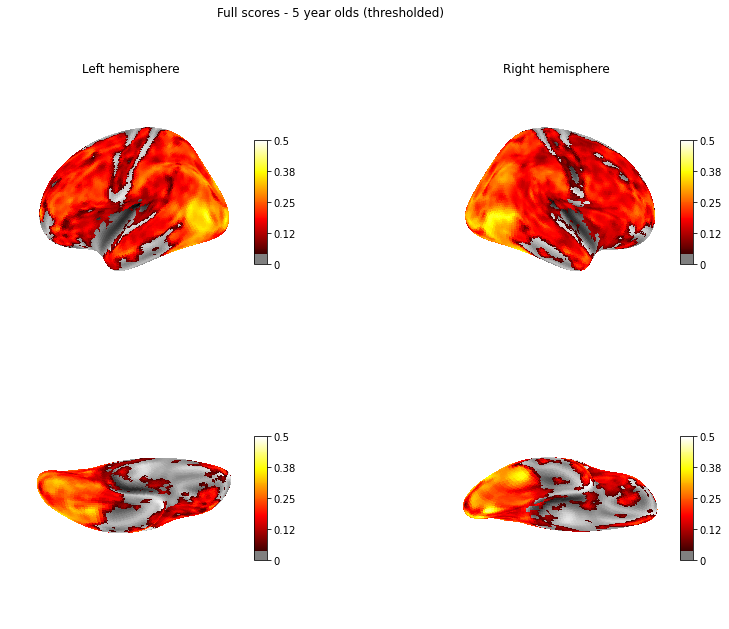

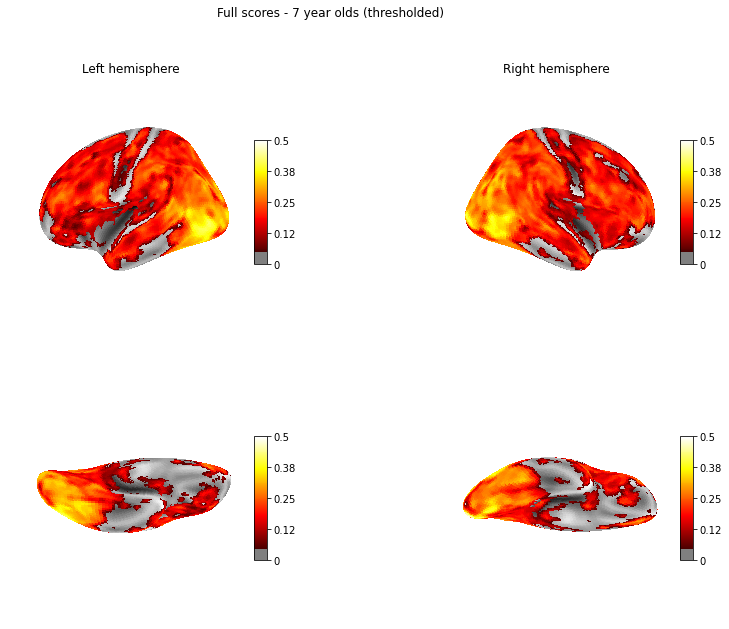

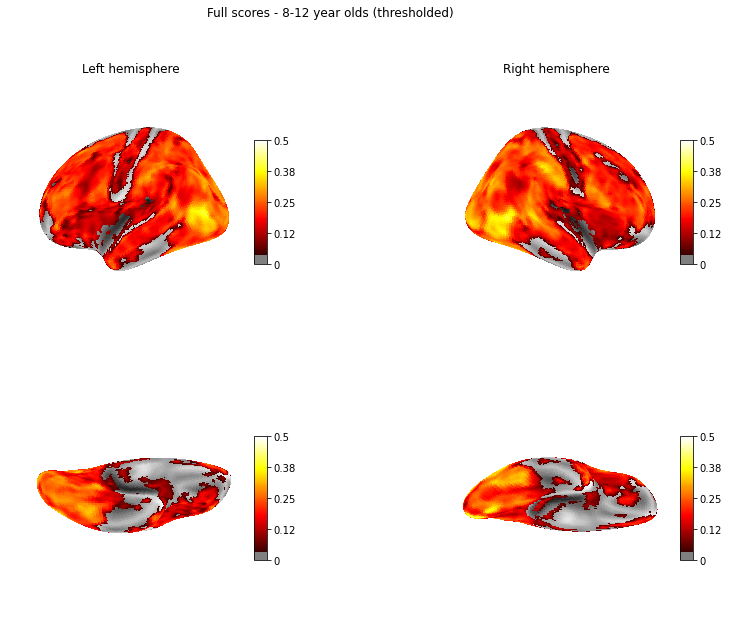

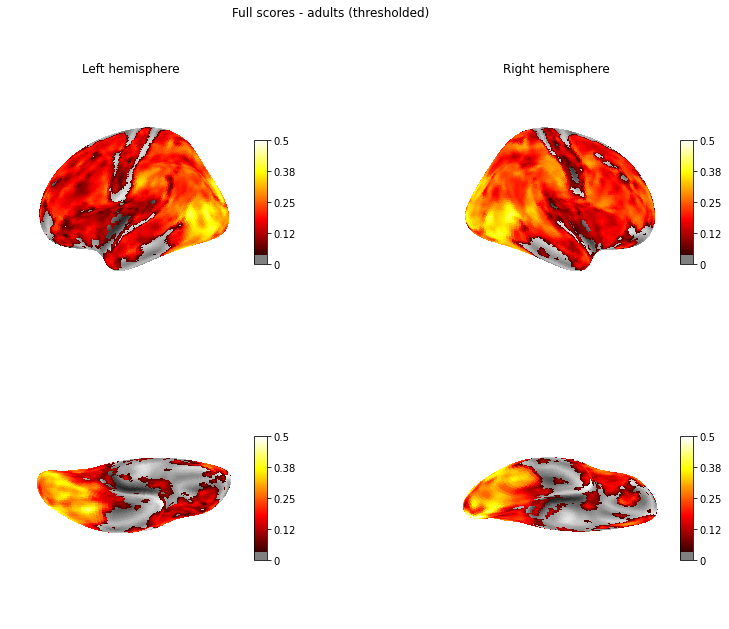

In [4]:
# 3-4 year olds
# vis_threshold = np.nanmin(full_scores_34yrs_unthresholded[full_scores_34yrs_unthresholded > 0])
# plot_surfaces_with_vmax( vol=make_vol(full_scores_34yrs_unthresholded, mask), 
#                             title='Full scores - 3-4 year olds (unthresholded)', 
#                             vis_threshold=vis_threshold, vmax=0.5)
# plt.savefig('full_scores_34u.pdf')

vis_threshold = np.nanmin(full_scores_34yrs_thresholded[full_scores_34yrs_thresholded > 0])
fig=plot_surfaces_with_vmax(vol=make_vol(full_scores_34yrs_thresholded, mask), 
                            title='Full scores - 3-4 year olds (thresholded)', 
                            vis_threshold=vis_threshold, vmax=0.5)
#fig.savefig('full_scores_34t.pdf')

# 5 year olds
# vis_threshold = np.nanmin(full_scores_5yrs_unthresholded[full_scores_5yrs_unthresholded > 0])
# plot_surfaces_with_vmax( vol=make_vol(full_scores_5yrs_unthresholded, mask), 
#                             title='Full scores - 5 year olds (unthresholded)', 
#                             vis_threshold=vis_threshold, vmax=0.5)
# plt.savefig('full_scores_5u.pdf')
vis_threshold = np.nanmin(full_scores_5yrs_thresholded[full_scores_5yrs_thresholded > 0])
fig =plot_surfaces_with_vmax(vol=make_vol(full_scores_5yrs_thresholded, mask), 
                            title='Full scores - 5 year olds (thresholded)', 
                            vis_threshold=vis_threshold, vmax=0.5)
#fig.savefig('full_scores_5t.pdf')

# 7 year olds
# vis_threshold = np.nanmin(full_scores_7yrs_unthresholded[full_scores_7yrs_unthresholded > 0])
# plot_surfaces_with_vmax(vol=make_vol(full_scores_7yrs_unthresholded, mask), 
#                             title='Full scores - 7 year olds (unthresholded)', 
#                             vis_threshold=vis_threshold, vmax=0.5)
# plt.savefig('full_scores_7u.pdf')
vis_threshold = np.nanmin(full_scores_7yrs_thresholded[full_scores_7yrs_thresholded > 0])
fig=plot_surfaces_with_vmax(vol=make_vol(full_scores_7yrs_thresholded, mask), 
                            title='Full scores - 7 year olds (thresholded)', 
                            vis_threshold=vis_threshold, vmax=0.5)
#fig.savefig('full_scores_7t.pdf')


# 8-12 year olds
# vis_threshold = np.nanmin(full_scores_812yrs_unthresholded[full_scores_812yrs_unthresholded > 0])
# plot_surfaces_with_vmax(vol=make_vol(full_scores_812yrs_unthresholded, mask), 
#                             title='Full scores - 8-12 year olds (unthresholded)', 
#                             vis_threshold=vis_threshold, vmax=0.5)
# plt.savefig('full_scores_812u.pdf')
vis_threshold = np.nanmin(full_scores_812yrs_thresholded[full_scores_812yrs_thresholded > 0])
fig=plot_surfaces_with_vmax(vol=make_vol(full_scores_812yrs_thresholded, mask), 
                            title='Full scores - 8-12 year olds (thresholded)', 
                            vis_threshold=vis_threshold, vmax=0.5)
#fig.savefig('full_scores_812t.pdf')


# Adults
# vis_threshold = np.nanmin(full_scores_adults_unthresholded[full_scores_adults_unthresholded > 0])
# plot_surfaces_with_vmax(vol=make_vol(full_scores_adults_unthresholded, mask), 
#                             title='Full scores - adults (unthresholded)', 
#                             vis_threshold=vis_threshold, vmax=0.5)
# plt.savefig('full_scores_adultsu.pdf')
vis_threshold = np.nanmin(full_scores_adults_thresholded[full_scores_adults_thresholded > 0])
fig=plot_surfaces_with_vmax(vol=make_vol(full_scores_adults_thresholded, mask), 
                            title='Full scores - adults (thresholded)', 
                            vis_threshold=vis_threshold, vmax=0.5)
#fig.savefig('full_scores_adultst.pdf')



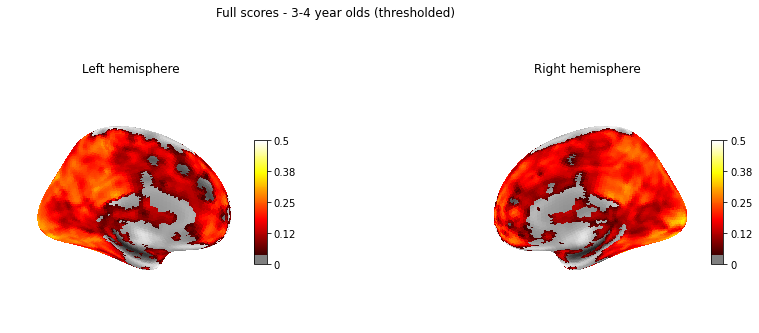

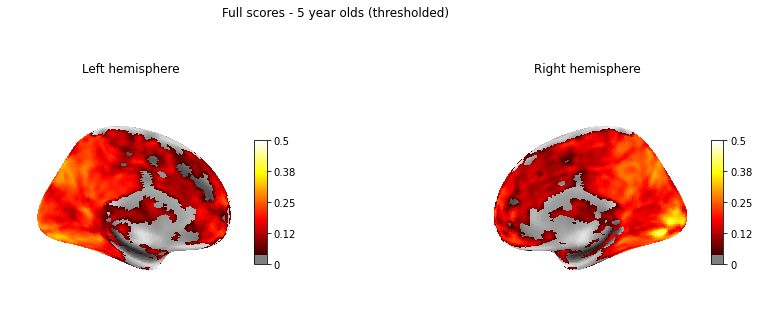

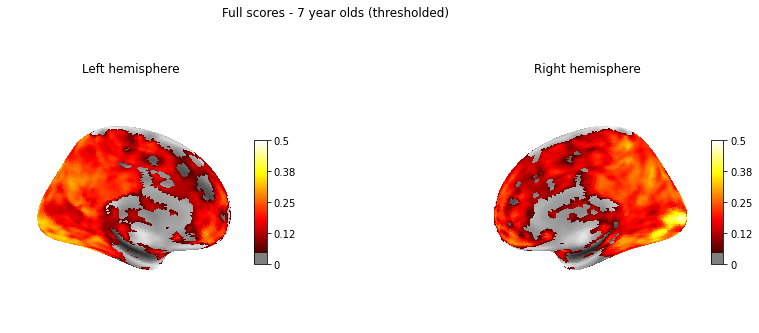

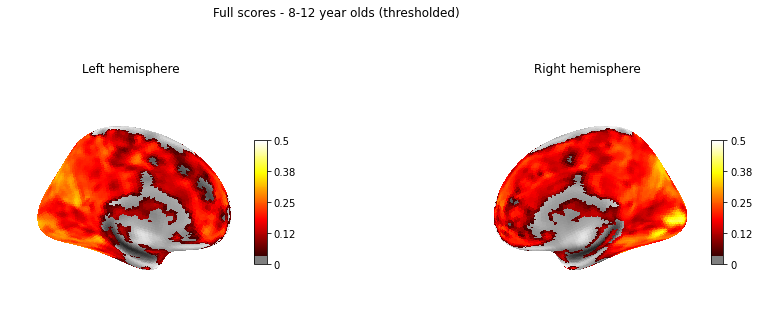

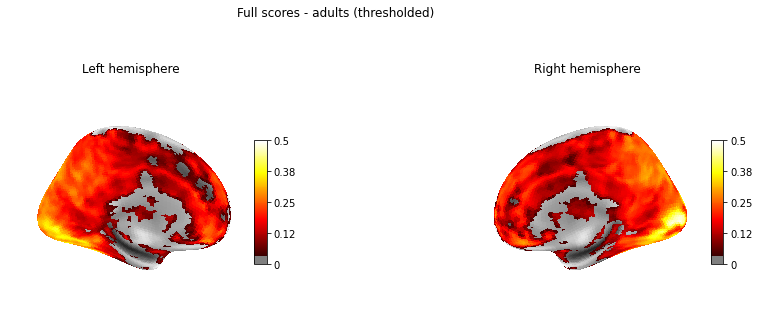

In [10]:
#plot medial wall

#3-4
vis_threshold = np.nanmin(full_scores_34yrs_thresholded[full_scores_34yrs_thresholded > 0])
fig=plot_medial_with_vmax(vol=make_vol(full_scores_34yrs_thresholded, mask), 
                            title='Full scores - 3-4 year olds (thresholded)', 
                            vis_threshold=vis_threshold, vmax=0.5)
fig.savefig('medial_full_scores_34t.png')

#5 yrs
vis_threshold = np.nanmin(full_scores_5yrs_thresholded[full_scores_5yrs_thresholded > 0])
fig =plot_medial_with_vmax(vol=make_vol(full_scores_5yrs_thresholded, mask), 
                            title='Full scores - 5 year olds (thresholded)', 
                            vis_threshold=vis_threshold, vmax=0.5)
fig.savefig('medial_full_scores_5t.png')

#7
vis_threshold = np.nanmin(full_scores_7yrs_thresholded[full_scores_7yrs_thresholded > 0])
fig =plot_medial_with_vmax(vol=make_vol(full_scores_7yrs_thresholded, mask), 
                            title='Full scores - 7 year olds (thresholded)', 
                            vis_threshold=vis_threshold, vmax=0.5)
fig.savefig('medial_full_scores_7t.png')

#8-12
vis_threshold = np.nanmin(full_scores_812yrs_thresholded[full_scores_812yrs_thresholded > 0])
fig =plot_medial_with_vmax(vol=make_vol(full_scores_812yrs_thresholded, mask), 
                            title='Full scores - 8-12 year olds (thresholded)', 
                            vis_threshold=vis_threshold, vmax=0.5)
fig.savefig('medial_full_scores_812t.png')

#adults
vis_threshold = np.nanmin(full_scores_adults_thresholded[full_scores_adults_thresholded > 0])
fig =plot_medial_with_vmax(vol=make_vol(full_scores_adults_thresholded, mask), 
                            title='Full scores - adults (thresholded)', 
                            vis_threshold=vis_threshold, vmax=0.5)
fig.savefig('medial_full_scores_adultst.png')

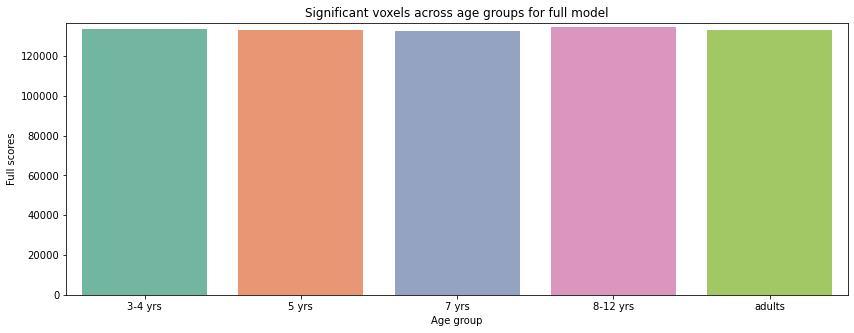

In [11]:
# Significance bar plot

fig = plt.figure(figsize=(14,5))
plt.title('Significant voxels across age groups for full model')
ax = sns.barplot(data=significance_df, x='Age group', y='Full scores', palette="Set2")
ax.set_ylim((0, 136543))
plt.savefig('sig_voxel_full.pdf')
plt.show()

[225785 232176 232244  72451 225784]
1
(34, 90, 25)
full model peak MNI: [10. 68.  0.]


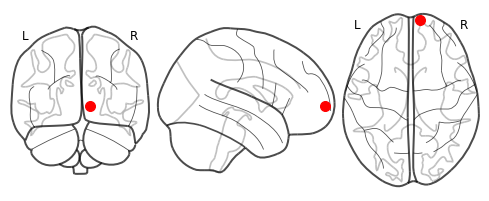

2
(35, 89, 24)
full model peak MNI: [ 8. 66. -2.]


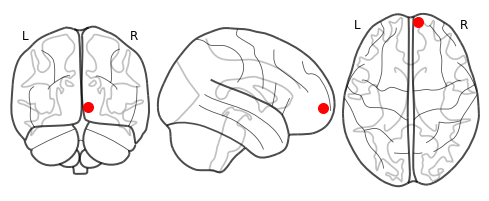

3
(35, 90, 24)
full model peak MNI: [ 8. 68. -2.]


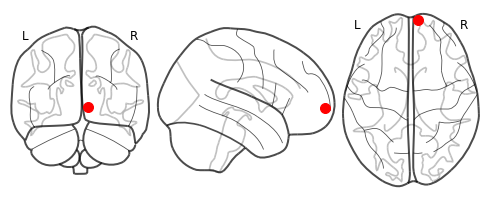

4
(11, 20, 31)
full model peak MNI: [ 56. -72.  12.]


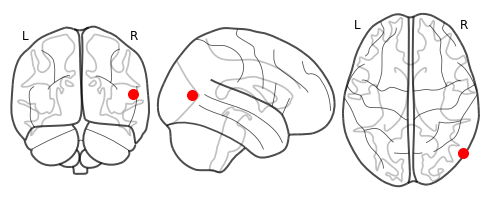

5
(34, 90, 24)
full model peak MNI: [10. 68. -2.]


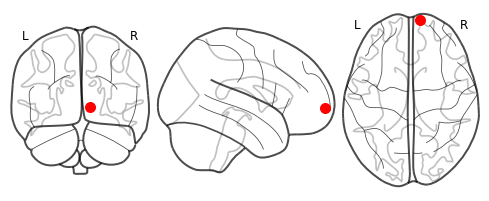

In [90]:
vis_threshold = np.nanmin(full_scores_34yrs_thresholded[full_scores_34yrs_thresholded > 0])
image34= make_vol(full_scores_34yrs_thresholded, mask)
data34 = image34.get_fdata()
data34=np.nan_to_num(data34)
ver2_sorted_indices = np.argsort(data34, axis = None)[-5:]
print(ver2_sorted_indices)

for i, idx in enumerate(ver2_sorted_indices):
    print (i+1)
    max_idx = np.unravel_index(idx, data34.shape)
    print(max_idx)
    mni_coordinates = nib.affines.apply_affine(mask.affine, max_idx)
    print('full model peak MNI:', mni_coordinates)
    #plot on MNI brain
    peak_coords = mni_coordinates
    display = plotting.plot_glass_brain(None, display_mode='ortho', plot_abs=False, colorbar=False)
    display.add_markers([peak_coords], marker_color='red', marker_size=100)
    plotting.show()
    
    

In [105]:
print(top_5_indices)
# Convert indices to MNI coordinates
top_5_mni_coordinates = [nib.affines.apply_affine(mask.affine, idx) for idx in top_5_indices]

[(30, 23, 49), (30, 23, 50), (30, 23, 51), (30, 19, 38), (39, 41, 28)]


full model peak MNI - 3 yrs: [10. 68. -2.]


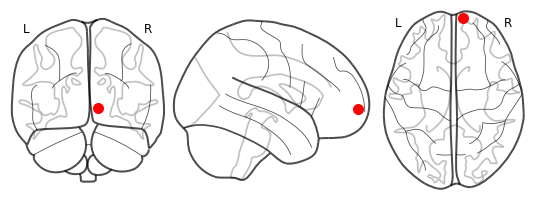

full model peak MNI - 5 yrs: [ 10. -82. -10.]


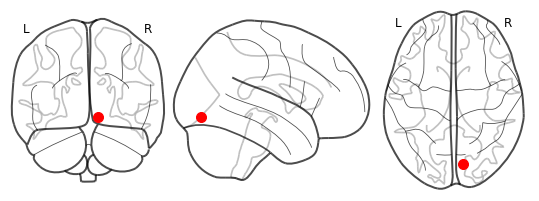

full model peak MNI - 7 yrs: [ 14. -92.   4.]


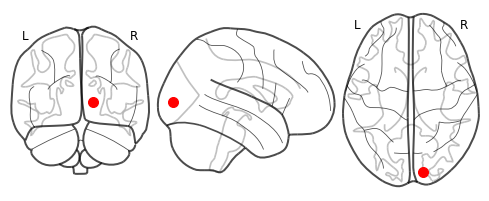

full model peak MNI - 8-12 yrs: [ 12. -86.   0.]


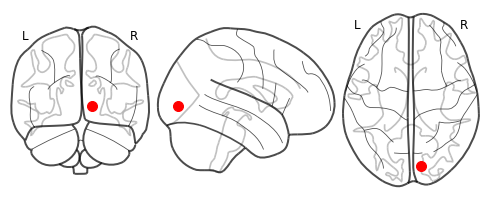

full model peak MNI - adults: [ 12. -90.  -4.]


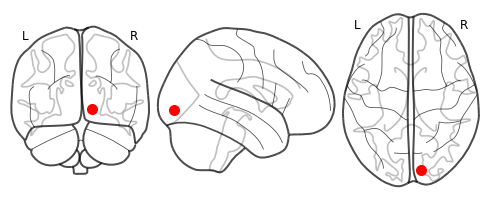

In [10]:
#Peak MNI

## 3-4 yrs ##
vis_threshold = np.nanmin(full_scores_34yrs_thresholded[full_scores_34yrs_thresholded > 0])
image3= make_vol(full_scores_34yrs_thresholded, mask)
data = image3.get_fdata()
# Find the index of the maximum value
max_idx = np.unravel_index(np.nanargmax(data, axis=None), data.shape)
# Convert voxel index to MNI coordinates
mni_coordinates_3 = nib.affines.apply_affine(image3.affine, max_idx)
print('full model peak MNI - 3 yrs:', mni_coordinates_3)
#plot on MNI brain
peak_coords = mni_coordinates_3 
display = plotting.plot_glass_brain(None, display_mode='ortho', plot_abs=False, colorbar=True)
display.add_markers([peak_coords], marker_color='red', marker_size=100)
plotting.show()

## 5-yrs ##
image5= make_vol(full_scores_5yrs_thresholded, mask)
data = image5.get_fdata()
# Find the index of the maximum value
max_idx = np.unravel_index(np.nanargmax(data, axis=None), data.shape)
# Convert voxel index to MNI coordinates
mni_coordinates_5 = nib.affines.apply_affine(image5.affine, max_idx)
print('full model peak MNI - 5 yrs:', mni_coordinates_5)
#plot on MNI brain
peak_coords = mni_coordinates_5 
display = plotting.plot_glass_brain(None, display_mode='ortho', plot_abs=False, colorbar=True)
display.add_markers([peak_coords], marker_color='red', marker_size=100)
plotting.show()

## 7-yrs ##
image7= make_vol(full_scores_7yrs_thresholded, mask)
data = image7.get_fdata()
# Find the index of the maximum value
max_idx = np.unravel_index(np.nanargmax(data, axis=None), data.shape)
# Convert voxel index to MNI coordinates
mni_coordinates_7 = nib.affines.apply_affine(image7.affine, max_idx)
print('full model peak MNI - 7 yrs:',mni_coordinates_7)
#plot on MNI brain
peak_coords = mni_coordinates_7 
display = plotting.plot_glass_brain(None, display_mode='ortho', plot_abs=False, colorbar=False)
display.add_markers([peak_coords], marker_color='red', marker_size=100)
plotting.show()

## 8-12 yrs ##
image812= make_vol(full_scores_812yrs_thresholded, mask)
data = image812.get_fdata()
# Find the index of the maximum value
max_idx = np.unravel_index(np.nanargmax(data, axis=None), data.shape)
# Convert voxel index to MNI coordinates
mni_coordinates_812 = nib.affines.apply_affine(image812.affine, max_idx)
print('full model peak MNI - 8-12 yrs:', mni_coordinates_812)
#plot on MNI brain
peak_coords = mni_coordinates_812
display = plotting.plot_glass_brain(None, display_mode='ortho', plot_abs=False, colorbar=False)
display.add_markers([peak_coords], marker_color='red', marker_size=100)
plotting.show()


## adults ##
image_adults= make_vol(full_scores_adults_thresholded, mask)
data = image_adults.get_fdata()
# Find the index of the maximum value
max_idx = np.unravel_index(np.nanargmax(data, axis=None), data.shape)
# Convert voxel index to MNI coordinates
mni_coordinates_adults = nib.affines.apply_affine(image_adults.affine, max_idx)
print('full model peak MNI - adults:', mni_coordinates_adults)
#plot on MNI brain
peak_coords = mni_coordinates_adults
display = plotting.plot_glass_brain(None, display_mode='ortho', plot_abs=False, colorbar=False)
display.add_markers([peak_coords], marker_color='red', marker_size=100)
plotting.show()
display.savefig('full_adult_peak_plot.png')

<h1>Motion energy scores</h1>

In [7]:
# Load unthresholded results
moten_scores_34yrs_unthresholded = np.mean(np.load(os.path.join(
    directory, '3-4-yrs', 'encoding_results', 'unthresholded_whole', '3-4-yrs_moten_only_scores_adult_isc_mask.npy')), axis=0)

moten_scores_5yrs_unthresholded = np.mean(np.load(os.path.join(
    directory, '5-yrs', 'encoding_results', 'unthresholded', '5-yrs_moten_only_scores_adult_isc_mask.npy')), axis=0)

moten_scores_7yrs_unthresholded = np.mean(np.load(os.path.join(
    directory, '7-yrs','encoding_results',  'unthresholded', '7-yrs_moten_only_scores_adult_isc_mask.npy')), axis=0)

moten_scores_812yrs_unthresholded = np.mean(np.load(os.path.join(
    directory, '8-12-yrs', 'encoding_results', 'unthresholded', '8-12-yrs_moten_only_scores_adult_isc_mask.npy')), axis=0)

moten_scores_adults_unthresholded = np.mean(np.load(os.path.join(
    directory, 'adults','encoding_results',  'unthresholded', 'adults_moten_only_scores_adult_isc_mask.npy')), axis=0)

# Load thresholded scores
moten_scores_34yrs_thresholded = np.load(os.path.join(
    directory, '3-4-yrs','encoding_results',  'thresholded_whole', '3-4-yrs_moten_only_scores_adult_isc_mask_thresholded05.npy'))

moten_scores_5yrs_thresholded = np.load(os.path.join(
    directory, '5-yrs','encoding_results',  'thresholded', '5-yrs_moten_only_scores_adult_isc_mask_thresholded05.npy'))

moten_scores_7yrs_thresholded = np.load(os.path.join(
    directory, '7-yrs', 'encoding_results', 'thresholded', '7-yrs_moten_only_scores_adult_isc_mask_thresholded05.npy'))

moten_scores_812yrs_thresholded = np.load(os.path.join(
    directory, '8-12-yrs', 'encoding_results', 'thresholded', '8-12-yrs_moten_only_scores_adult_isc_mask_thresholded05.npy'))

moten_scores_adults_thresholded = np.load(os.path.join(
    directory, 'adults', 'encoding_results', 'thresholded', 'adults_moten_only_scores_adult_isc_mask_thresholded05.npy'))

In [ ]:
# 3-4 year olds
# vis_threshold = np.nanmin(moten_scores_34yrs_unthresholded[moten_scores_34yrs_unthresholded > 0])
# plot_surfaces_with_vmax( vol=make_vol(moten_scores_34yrs_unthresholded, mask), 
#                             title='Motion energy scores - 3-4 year olds (unthresholded)', 
#                             vis_threshold=vis_threshold, vmax = 0.5)
# plt.savefig('moten_scores_34u.pdf')
vis_threshold = np.nanmin(moten_scores_34yrs_thresholded[moten_scores_34yrs_thresholded > 0])
fig = plot_surfaces_with_vmax(vol=make_vol(moten_scores_34yrs_thresholded, mask), 
                            title='Motion energy scores - 3-4 year olds (thresholded)', 
                            vis_threshold=vis_threshold, vmax = 0.5)
#fig.savefig('moten_scores_34t.pdf')


# 5 year olds
# vis_threshold = np.nanmin(moten_scores_5yrs_unthresholded[moten_scores_5yrs_unthresholded > 0])
# plot_surfaces_with_vmax(vol=make_vol(moten_scores_5yrs_unthresholded, mask), 
#                             title='Motion energy scores - 5 year olds (unthresholded)', 
#                             vis_threshold=vis_threshold, vmax = 0.5)
# plt.savefig('moten_scores_5u.pdf')
vis_threshold = np.nanmin(moten_scores_5yrs_thresholded[moten_scores_5yrs_thresholded > 0])
fig =plot_surfaces_with_vmax(vol=make_vol(moten_scores_5yrs_thresholded, mask), 
                            title='Motion energy scores - 5 year olds (thresholded)', 
                            vis_threshold=vis_threshold, vmax = 0.5)
#fig.savefig('moten_scores_5t.pdf')

# 7 year olds
# vis_threshold = np.nanmin(moten_scores_7yrs_unthresholded[moten_scores_7yrs_unthresholded > 0])
# plot_surfaces_with_vmax(vol=make_vol(moten_scores_7yrs_unthresholded, mask), 
#                             title='Motion energy scores - 7 year olds (unthresholded)', 
#                             vis_threshold=vis_threshold, vmax = 0.5)
# plt.savefig('moten_scores_7u.pdf')
vis_threshold = np.nanmin(moten_scores_7yrs_thresholded[moten_scores_7yrs_thresholded > 0])
fig =plot_surfaces_with_vmax(vol=make_vol(moten_scores_7yrs_thresholded, mask), 
                            title='Motion energy scores - 7 year olds (thresholded)', 
                            vis_threshold=vis_threshold, vmax = 0.5)
#fig.savefig('moten_scores_7t.pdf')

# 8-12 year olds
# vis_threshold = np.nanmin(moten_scores_812yrs_unthresholded[moten_scores_812yrs_unthresholded > 0])
# plot_surfaces_with_vmax(vol=make_vol(moten_scores_812yrs_unthresholded, mask), 
#                             title='Motion energy scores - 8-12 year olds (unthresholded)', 
#                             vis_threshold=vis_threshold, vmax = 0.5)
# plt.savefig('moten_scores_812u.pdf')
vis_threshold = np.nanmin(moten_scores_812yrs_thresholded[moten_scores_812yrs_thresholded > 0])
fig =plot_surfaces_with_vmax(vol=make_vol(moten_scores_812yrs_thresholded, mask), 
                            title='Motion energy scores - 8-12 year olds (thresholded)', 
                            vis_threshold=vis_threshold, vmax = 0.5)
#fig.savefig('moten_scores_812t.pdf')

# Adults
# vis_threshold = np.nanmin(moten_scores_adults_unthresholded[moten_scores_adults_unthresholded > 0])
# plot_surfaces_with_vmax(vol=make_vol(moten_scores_adults_unthresholded, mask), 
#                             title='Motion energy scores - adults (unthresholded)', 
#                             vis_threshold=vis_threshold, vmax = 0.5)
# plt.savefig('moten_scores_adultsu.pdf')
vis_threshold = np.nanmin(moten_scores_adults_thresholded[moten_scores_adults_thresholded > 0])
fig =plot_surfaces_with_vmax(vol=make_vol(moten_scores_adults_thresholded, mask), 
                             title='Motion energy scores - adults (thresholded)', 
                             vis_threshold=vis_threshold, vmax = 0.5)
#fig.savefig('moten_scores_adultst.pdf')

In [ ]:
#plot medial view
vis_threshold = np.nanmin(moten_scores_34yrs_thresholded[moten_scores_34yrs_thresholded > 0])
fig =plot_medial_with_vmax(vol=make_vol(moten_scores_34yrs_thresholded, mask), 
                            title='moten scores - 3-4 year olds (thresholded)', 
                            vis_threshold=vis_threshold, vmax=0.5)
fig.savefig('medial_moten_scores_34t.png')

vis_threshold = np.nanmin(moten_scores_5yrs_thresholded[moten_scores_5yrs_thresholded > 0])
fig =plot_medial_with_vmax(vol=make_vol(moten_scores_5yrs_thresholded, mask), 
                            title='moten scores - 5 year olds (thresholded)', 
                            vis_threshold=vis_threshold, vmax=0.5)
fig.savefig('medial_moten_scores_5t.png')

vis_threshold = np.nanmin(moten_scores_7yrs_thresholded[moten_scores_7yrs_thresholded > 0])
fig =plot_medial_with_vmax(vol=make_vol(moten_scores_7yrs_thresholded, mask), 
                            title='moten scores - 7 year olds (thresholded)', 
                            vis_threshold=vis_threshold, vmax=0.5)
fig.savefig('medial_moten_scores_7t.png')

vis_threshold = np.nanmin(moten_scores_812yrs_thresholded[moten_scores_812yrs_thresholded > 0])
fig =plot_medial_with_vmax(vol=make_vol(moten_scores_812yrs_thresholded, mask), 
                            title='moten scores - 8-12 year olds (thresholded)', 
                            vis_threshold=vis_threshold, vmax=0.5)
fig.savefig('medial_moten_scores_812t.png')


vis_threshold = np.nanmin(moten_scores_adults_thresholded[moten_scores_adults_thresholded > 0])
fig =plot_medial_with_vmax(vol=make_vol(moten_scores_adults_thresholded, mask), 
                            title='moten scores - adults (thresholded)', 
                            vis_threshold=vis_threshold, vmax=0.5)
fig.savefig('medial_moten_scores_adultst.png')

In [ ]:
# Significance bar plot

# Significance bar plot

fig = plt.figure(figsize=(14,5))
plt.title('Significant voxels across age groups for motion energy model')
ax = sns.barplot(data=significance_df, x='Age group', y='Motion energy scores', palette="Set2")
ax.set_ylim((0, 136543))
plt.savefig('sig_voxels_moten.pdf')
plt.show()

motion(visual) model peak MNI - 3 yrs: [ 14. -82.  -8.]


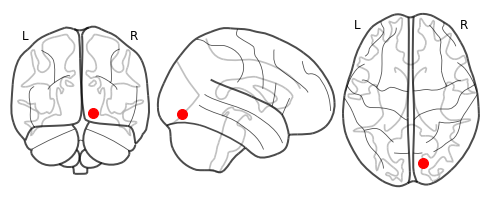

motion(visual) model peak MNI - 5 yrs: [ 14. -78. -10.]


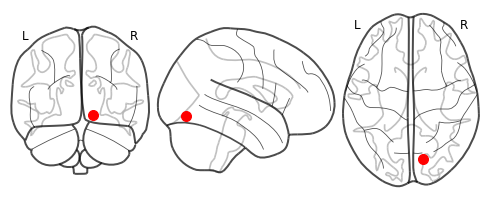

motion(visual) model peak MNI - 7 yrs: [ 14. -92.   4.]


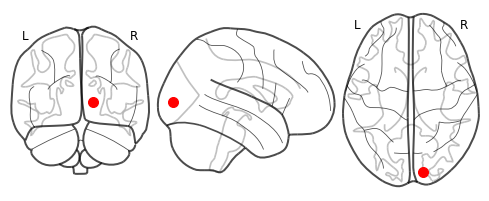

motion(visual) model peak MNI - 8-12 yrs: [ 12. -86.   0.]


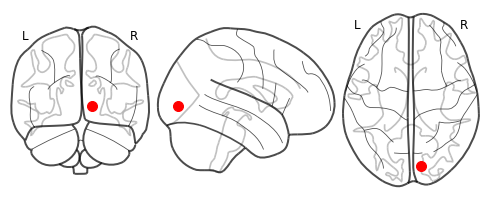

motion(visual) model peak MNI - adults: [ 10. -90.  -4.]


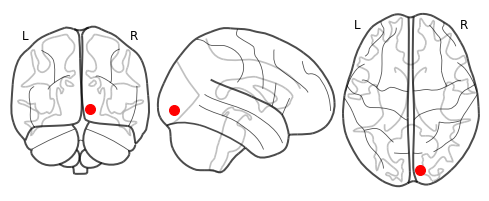

In [8]:
#peak MNI

image34= make_vol(moten_scores_34yrs_thresholded, mask)
data = image34.get_fdata()
# Find the index of the maximum value
max_idx = np.unravel_index(np.nanargmax(data, axis=None), data.shape)
# Convert voxel index to MNI coordinates
mni_coordinates_3 = nib.affines.apply_affine(image34.affine, max_idx)
print('motion(visual) model peak MNI - 3 yrs:',mni_coordinates_3)
#plot on MNI brain
peak_coords = mni_coordinates_3
display = plotting.plot_glass_brain(None, display_mode='ortho', plot_abs=False, colorbar=False)
display.add_markers([peak_coords], marker_color='red', marker_size=100)
plotting.show()



image5= make_vol(moten_scores_5yrs_thresholded, mask)
data = image5.get_fdata()
# Find the index of the maximum value
max_idx = np.unravel_index(np.nanargmax(data, axis=None), data.shape)
# Convert voxel index to MNI coordinates
mni_coordinates_5 = nib.affines.apply_affine(image5.affine, max_idx)
print('motion(visual) model peak MNI - 5 yrs:', mni_coordinates_5)
#plot on MNI brain
peak_coords = mni_coordinates_5
display = plotting.plot_glass_brain(None, display_mode='ortho', plot_abs=False, colorbar=False)
display.add_markers([peak_coords], marker_color='red', marker_size=100)
plotting.show()



image7= make_vol(moten_scores_7yrs_thresholded, mask)
data = image7.get_fdata()
# Find the index of the maximum value
max_idx = np.unravel_index(np.nanargmax(data, axis=None), data.shape)
# Convert voxel index to MNI coordinates
mni_coordinates_7 = nib.affines.apply_affine(image7.affine, max_idx)
print('motion(visual) model peak MNI - 7 yrs:',mni_coordinates_7)
#plot on MNI brain
peak_coords = mni_coordinates_7
display = plotting.plot_glass_brain(None, display_mode='ortho', plot_abs=False, colorbar=False)
display.add_markers([peak_coords], marker_color='red', marker_size=100)
plotting.show()



image812= make_vol(moten_scores_812yrs_thresholded, mask)
data = image812.get_fdata()
# Find the index of the maximum value
max_idx = np.unravel_index(np.nanargmax(data, axis=None), data.shape)
# Convert voxel index to MNI coordinates
mni_coordinates_812 = nib.affines.apply_affine(image812.affine, max_idx)
print('motion(visual) model peak MNI - 8-12 yrs:', mni_coordinates_812)
#plot on MNI brain
peak_coords = mni_coordinates_812
display = plotting.plot_glass_brain(None, display_mode='ortho', plot_abs=False, colorbar=False)
display.add_markers([peak_coords], marker_color='red', marker_size=100)
plotting.show()



image_adults= make_vol(moten_scores_adults_thresholded, mask)
data = image_adults.get_fdata()
# Find the index of the maximum value
max_idx = np.unravel_index(np.nanargmax(data, axis=None), data.shape)
# Convert voxel index to MNI coordinates
mni_coordinates_adults = nib.affines.apply_affine(image_adults.affine, max_idx)
print('motion(visual) model peak MNI - adults:', mni_coordinates_adults)
#plot on MNI brain
peak_coords = mni_coordinates_adults
display = plotting.plot_glass_brain(None, display_mode='ortho', plot_abs=False, colorbar=False)
display.add_markers([peak_coords], marker_color='red', marker_size=100)
plotting.show()
display.savefig('moten_adult_peak_plot.png')

<h1>Social scores</h1>

In [13]:
# Load unthresholded results
social_scores_34yrs_unthresholded = np.mean(np.load(os.path.join(
    directory, '3-4-yrs','encoding_results',  'unthresholded_whole', '3-4-yrs_social_only_scores_adult_isc_mask.npy')), axis=0)

social_scores_5yrs_unthresholded = np.mean(np.load(os.path.join(
    directory, '5-yrs','encoding_results',  'unthresholded', '5-yrs_social_only_scores_adult_isc_mask.npy')), axis=0)

social_scores_7yrs_unthresholded = np.mean(np.load(os.path.join(
    directory, '7-yrs','encoding_results',  'unthresholded', '7-yrs_social_only_scores_adult_isc_mask.npy')), axis=0)

social_scores_812yrs_unthresholded = np.mean(np.load(os.path.join(
    directory, '8-12-yrs','encoding_results',  'unthresholded', '8-12-yrs_social_only_scores_adult_isc_mask.npy')), axis=0)

social_scores_adults_unthresholded = np.mean(np.load(os.path.join(
    directory, 'adults', 'encoding_results', 'unthresholded', 'adults_social_only_scores_adult_isc_mask.npy')), axis=0)

# Load thresholded scores
social_scores_34yrs_thresholded = np.load(os.path.join(
    directory, '3-4-yrs','encoding_results',  'thresholded_whole', '3-4-yrs_social_only_scores_adult_isc_mask_thresholded05.npy'))

social_scores_5yrs_thresholded = np.load(os.path.join(
    directory, '5-yrs','encoding_results',  'thresholded', '5-yrs_social_only_scores_adult_isc_mask_thresholded05.npy'))

social_scores_7yrs_thresholded = np.load(os.path.join(
    directory, '7-yrs','encoding_results',  'thresholded', '7-yrs_social_only_scores_adult_isc_mask_thresholded05.npy'))

social_scores_812yrs_thresholded = np.load(os.path.join(
    directory, '8-12-yrs', 'encoding_results', 'thresholded', '8-12-yrs_social_only_scores_adult_isc_mask_thresholded05.npy'))

social_scores_adults_thresholded = np.load(os.path.join(
    directory, 'adults','encoding_results',  'thresholded', 'adults_social_only_scores_adult_isc_mask_thresholded05.npy'))

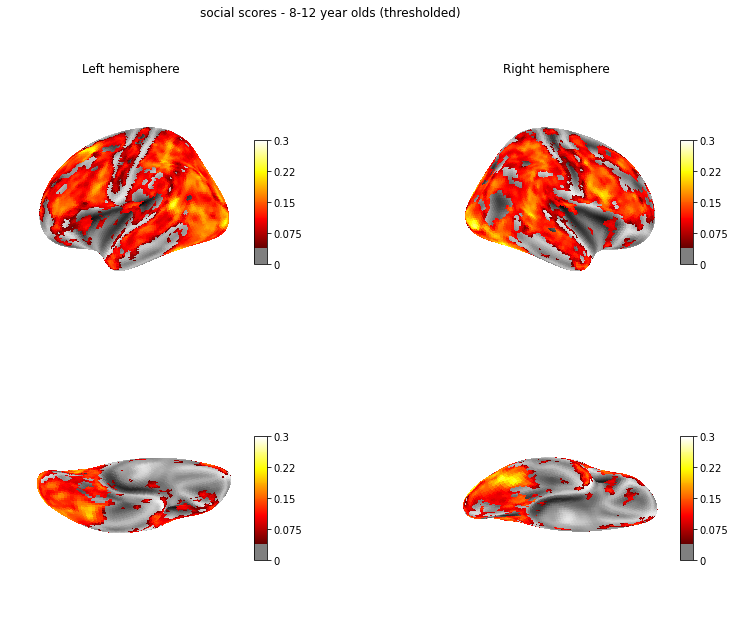

In [11]:
# 8-12 year olds
# vis_threshold = np.nanmin(social_scores_812yrs_unthresholded[social_scores_812yrs_unthresholded > 0])
# plot_surfaces_with_vmax(vol=make_vol(social_scores_812yrs_unthresholded, mask), 
#                             title='social scores - 8-12 year olds (unthresholded)', 
#                             vis_threshold=vis_threshold, vmax=0.3)
# plt.savefig('social_scores_812u.pdf')
vis_threshold = np.nanmin(moten_scores_7yrs_thresholded[moten_scores_7yrs_thresholded > 0])
fig =plot_surfaces_with_vmax(vol=make_vol(social_scores_812yrs_thresholded, mask), 
                            title='social scores - 8-12 year olds (thresholded)', 
                            vis_threshold=vis_threshold, vmax=0.3)
fig.savefig('social_scores_812t.pdf')

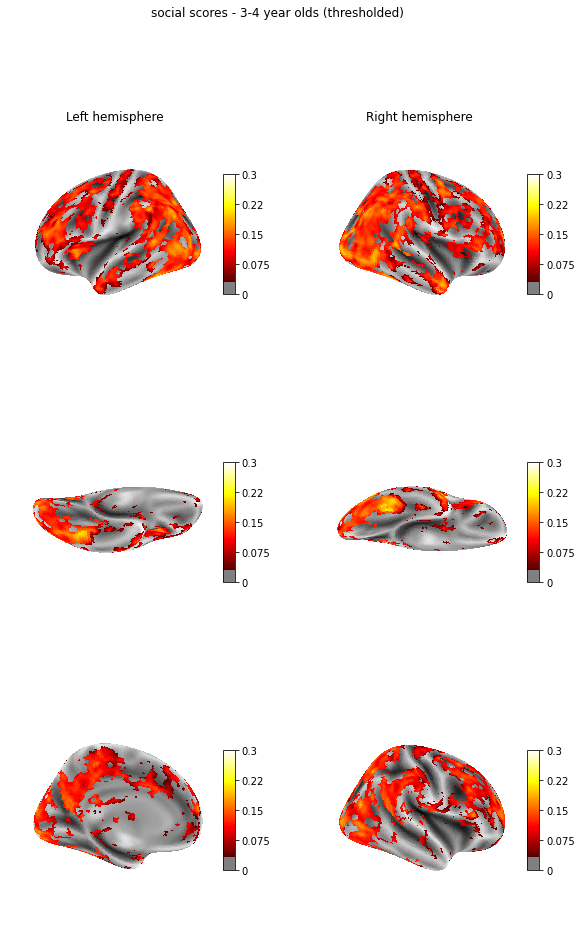

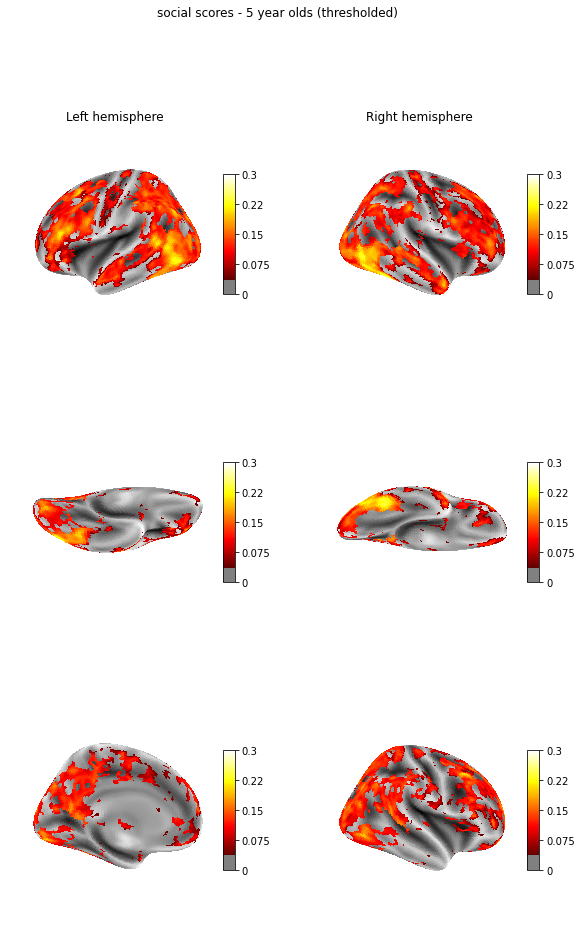

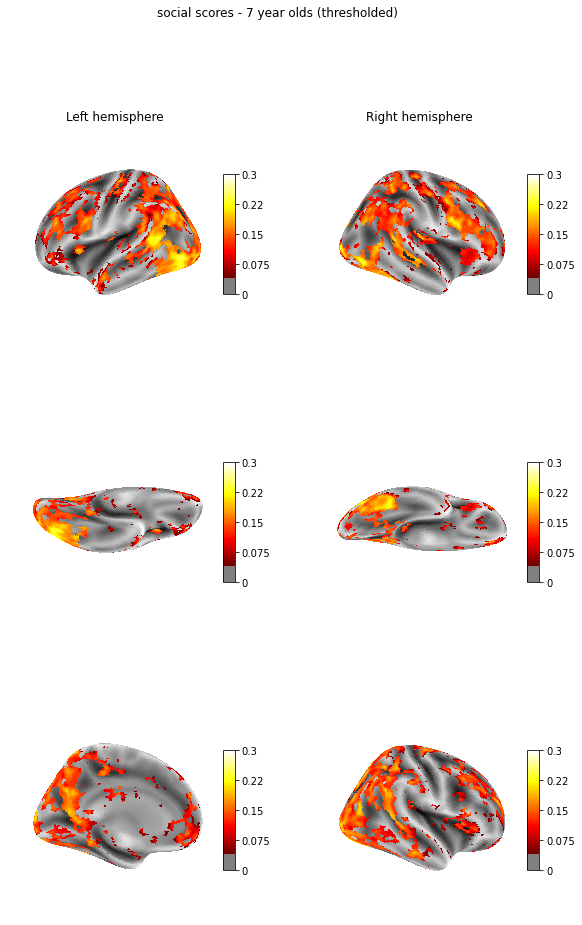

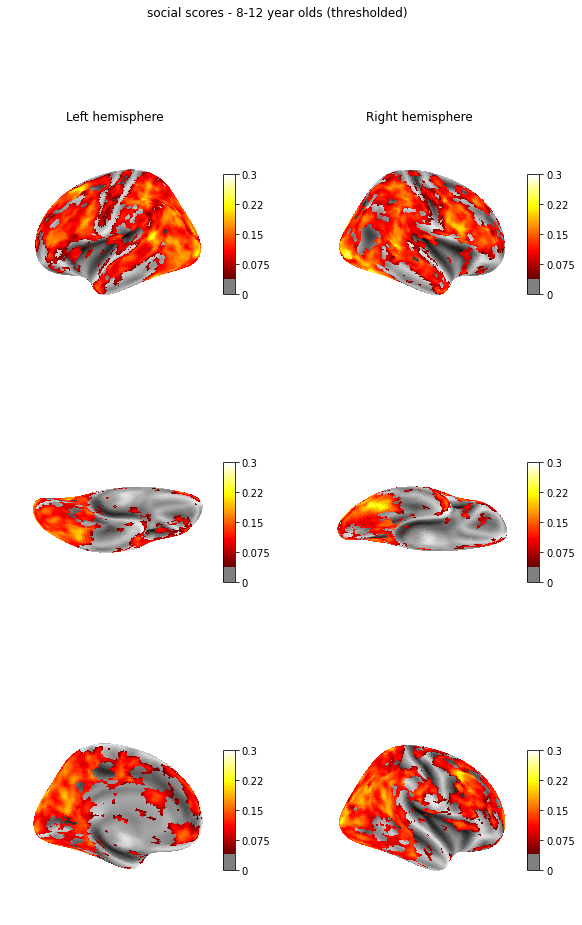

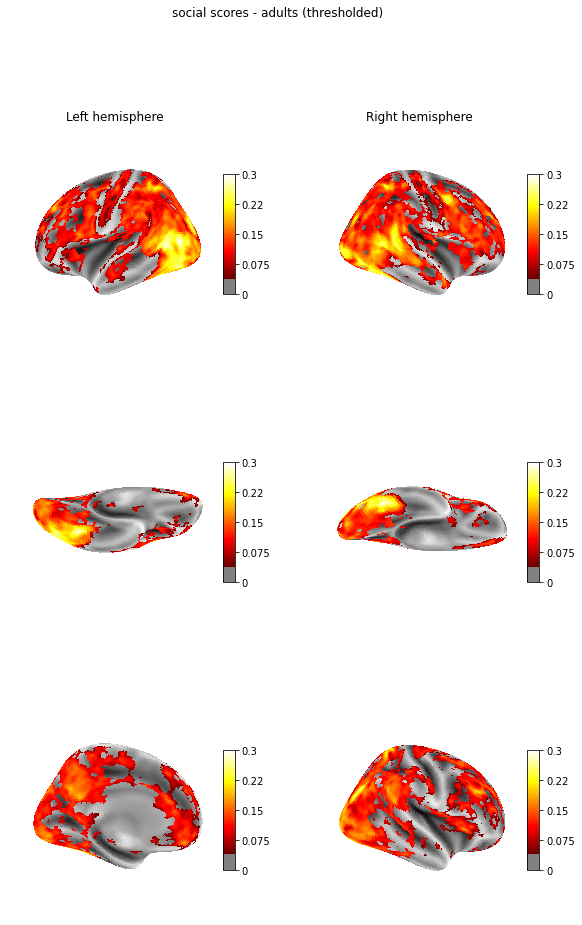

In [10]:
# 3-4 year olds
# vis_threshold = np.nanmin(social_scores_34yrs_unthresholded[social_scores_34yrs_unthresholded > 0])
# plot_surfaces_with_vmax(vol=make_vol(social_scores_34yrs_unthresholded, mask), 
#                             title='social scores - 3-4 year olds (unthresholded)', 
#                             vis_threshold=vis_threshold, vmax=0.3)
# plt.savefig('social_scores_34u.pdf')
vis_threshold = np.nanmin(social_scores_34yrs_thresholded[social_scores_34yrs_thresholded > 0])
fig =plot_surfaces_with_vmax(vol=make_vol(social_scores_34yrs_thresholded, mask), 
                            title='social scores - 3-4 year olds (thresholded)', 
                            vis_threshold=vis_threshold, vmax=0.3)
#fig.savefig('social_scores_34t.pdf')

# 5 year olds
# vis_threshold = np.nanmin(social_scores_5yrs_unthresholded[social_scores_5yrs_unthresholded > 0])
# plot_surfaces_with_vmax(vol=make_vol(social_scores_5yrs_unthresholded, mask), 
#                             title='social scores - 5 year olds (unthresholded)', 
#                             vis_threshold=vis_threshold, vmax=0.3)
# plt.savefig('social_scores_5u.pdf')
vis_threshold = np.nanmin(social_scores_5yrs_thresholded[social_scores_5yrs_thresholded > 0])
fig =plot_surfaces_with_vmax(vol=make_vol(social_scores_5yrs_thresholded, mask), 
                            title='social scores - 5 year olds (thresholded)', 
                            vis_threshold=vis_threshold, vmax=0.3)
#fig.savefig('social_scores_5t.pdf')

# 7 year olds
# vis_threshold = np.nanmin(social_scores_7yrs_unthresholded[social_scores_7yrs_unthresholded > 0])
# plot_surfaces_with_vmax(vol=make_vol(social_scores_7yrs_unthresholded, mask), 
#                             title='social scores - 7 year olds (unthresholded)', 
#                             vis_threshold=vis_threshold, vmax=0.3)
# plt.savefig('social_scores_7u.pdf')
vis_threshold = np.nanmin(social_scores_7yrs_thresholded[social_scores_7yrs_thresholded > 0])
fig =plot_surfaces_with_vmax(vol=make_vol(social_scores_7yrs_thresholded, mask), 
                            title='social scores - 7 year olds (thresholded)', 
                            vis_threshold=vis_threshold, vmax=0.3)
#fig.savefig('social_scores_7t.pdf')

# 8-12 year olds
# vis_threshold = np.nanmin(social_scores_812yrs_unthresholded[social_scores_812yrs_unthresholded > 0])
# plot_surfaces_with_vmax(vol=make_vol(social_scores_812yrs_unthresholded, mask), 
#                             title='social scores - 8-12 year olds (unthresholded)', 
#                             vis_threshold=vis_threshold, vmax=0.3)
# plt.savefig('social_scores_812u.pdf')
vis_threshold = np.nanmin(moten_scores_7yrs_thresholded[moten_scores_7yrs_thresholded > 0])
fig =plot_surfaces_with_vmax(vol=make_vol(social_scores_812yrs_thresholded, mask), 
                            title='social scores - 8-12 year olds (thresholded)', 
                            vis_threshold=vis_threshold, vmax=0.3)
#fig.savefig('social_scores_812t.pdf')

# Adults
# vis_threshold = np.nanmin(social_scores_adults_unthresholded[social_scores_adults_unthresholded > 0])
# plot_surfaces_with_vmax(vol=make_vol(social_scores_adults_unthresholded, mask), 
#                             title='social scores - adults (unthresholded)', 
#                             vis_threshold=vis_threshold, vmax=0.3)
# plt.savefig('social_scores_adultsu.pdf')
vis_threshold = np.nanmin(social_scores_adults_thresholded[social_scores_adults_thresholded > 0])
fig =plot_surfaces_with_vmax(vol=make_vol(social_scores_adults_thresholded, mask), 
                            title='social scores - adults (thresholded)', 
                            vis_threshold=vis_threshold, vmax=0.3)
#fig.savefig('social_scores_adultst.pdf')


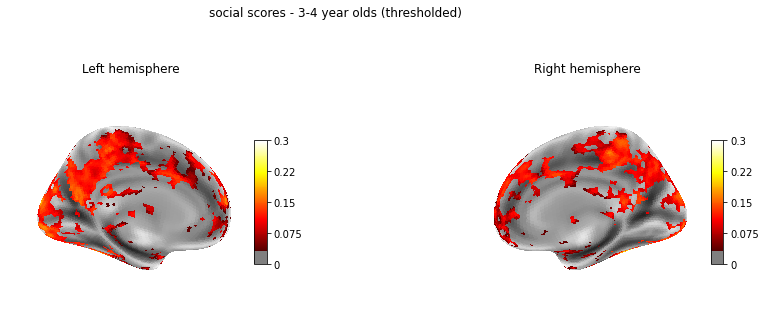

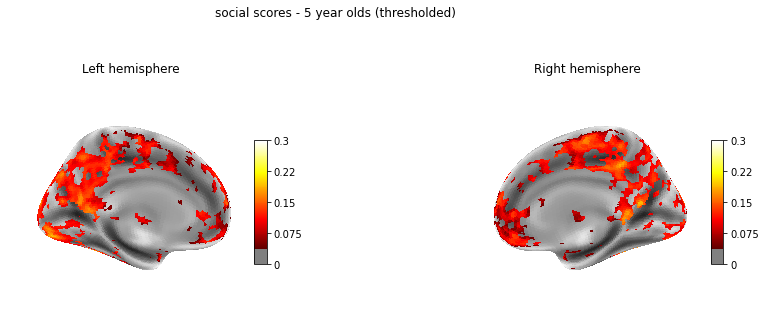

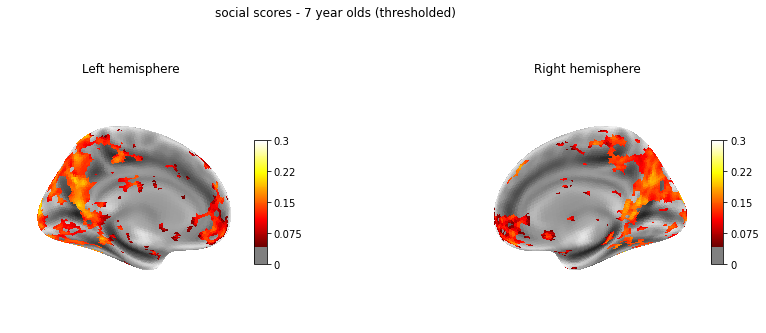

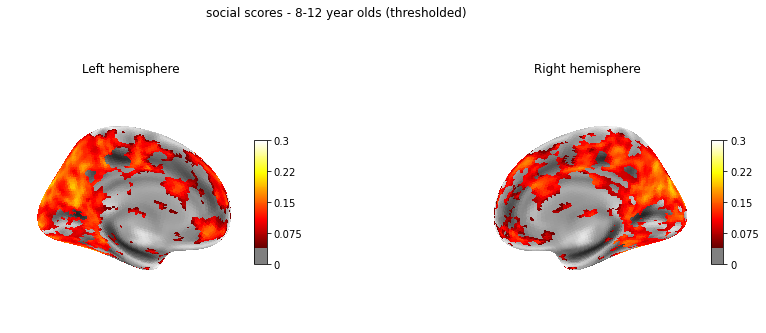

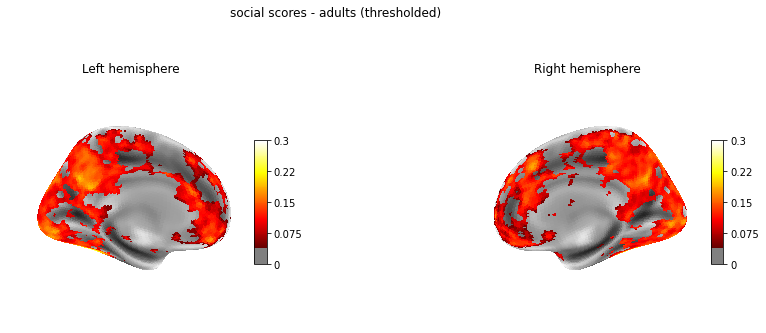

In [20]:
#plot medial view
vis_threshold = np.nanmin(social_scores_34yrs_thresholded[social_scores_34yrs_thresholded > 0])
fig =plot_medial_with_vmax(vol=make_vol(social_scores_34yrs_thresholded, mask), 
                            title='social scores - 3-4 year olds (thresholded)', 
                            vis_threshold=vis_threshold, vmax=0.3)
fig.savefig('medial_social_scores_34t.png')

vis_threshold = np.nanmin(social_scores_5yrs_thresholded[social_scores_5yrs_thresholded > 0])
fig =plot_medial_with_vmax(vol=make_vol(social_scores_5yrs_thresholded, mask), 
                            title='social scores - 5 year olds (thresholded)', 
                            vis_threshold=vis_threshold, vmax=0.3)
fig.savefig('medial_social_scores_5t.png')

vis_threshold = np.nanmin(social_scores_7yrs_thresholded[social_scores_7yrs_thresholded > 0])
fig =plot_medial_with_vmax(vol=make_vol(social_scores_7yrs_thresholded, mask), 
                            title='social scores - 7 year olds (thresholded)', 
                            vis_threshold=vis_threshold, vmax=0.3)
fig.savefig('medial_social_scores_7t.png')

vis_threshold = np.nanmin(social_scores_812yrs_thresholded[social_scores_812yrs_thresholded > 0])
fig =plot_medial_with_vmax(vol=make_vol(social_scores_812yrs_thresholded, mask), 
                            title='social scores - 8-12 year olds (thresholded)', 
                            vis_threshold=vis_threshold, vmax=0.3)
fig.savefig('medial_social_scores_812t.png')


vis_threshold = np.nanmin(social_scores_adults_thresholded[social_scores_adults_thresholded > 0])
fig =plot_medial_with_vmax(vol=make_vol(social_scores_adults_thresholded, mask), 
                            title='social scores - adults (thresholded)', 
                            vis_threshold=vis_threshold, vmax=0.3)
fig.savefig('medial_social_scores_adultst.png')

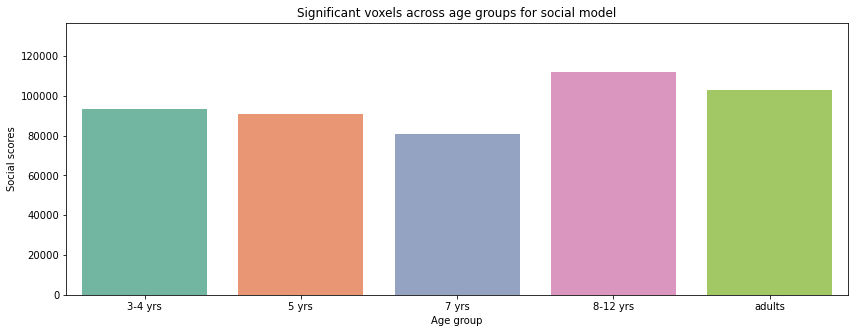

In [16]:
# Significance bar plot

fig = plt.figure(figsize=(14,5))
plt.title('Significant voxels across age groups for social model')
ax = sns.barplot(data=significance_df, x='Age group', y='Social scores', palette="Set2")
ax.set_ylim((0, 136543))
plt.savefig('sig_voxels_social.pdf')
plt.show()

social model peak MNI - 3 yrs: [ 40. -50. -22.]


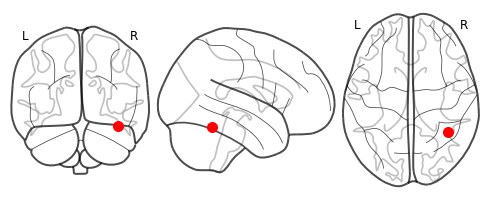

social model peak MNI - 5 yrs: [ 40. -72.  -2.]


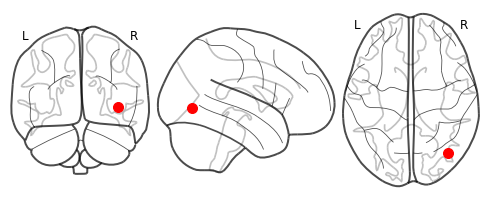

social model peak MNI - 7 yrs: [-40. -50. -16.]


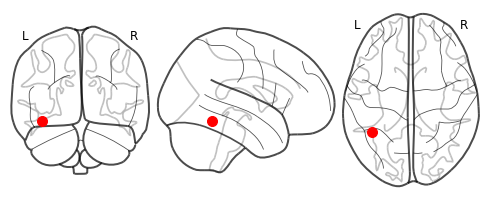

social model peak MNI - 8-12 yrs: [ 38. -88.  -6.]


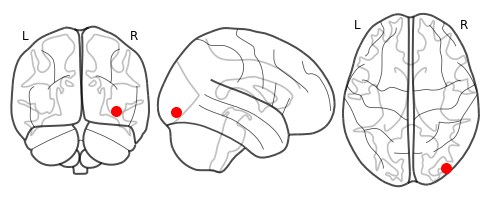

social model peak MNI - adults: [-54. -72.   8.]


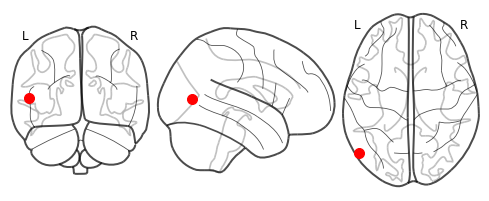

In [12]:
#peak MNI

image34= make_vol(social_scores_34yrs_thresholded, mask)
data = image34.get_fdata()
# Find the index of the maximum value
max_idx = np.unravel_index(np.nanargmax(data, axis=None), data.shape)
# Convert voxel index to MNI coordinates
mni_coordinates_3 = nib.affines.apply_affine(image34.affine, max_idx)
print('social model peak MNI - 3 yrs:',mni_coordinates_3)
#plot on MNI brain
peak_coords = mni_coordinates_3
display = plotting.plot_glass_brain(None, display_mode='ortho', plot_abs=False, colorbar=False)
display.add_markers([peak_coords], marker_color='red', marker_size=100)
plotting.show()
display.savefig('moten_adult_peak_plot.png')


image5= make_vol(social_scores_5yrs_thresholded, mask)
data = image5.get_fdata()
# Find the index of the maximum value
max_idx = np.unravel_index(np.nanargmax(data, axis=None), data.shape)
# Convert voxel index to MNI coordinates
mni_coordinates_5 = nib.affines.apply_affine(image5.affine, max_idx)
print('social model peak MNI - 5 yrs:', mni_coordinates_5)
#plot on MNI brain
peak_coords = mni_coordinates_5
display = plotting.plot_glass_brain(None, display_mode='ortho', plot_abs=False, colorbar=False)
display.add_markers([peak_coords], marker_color='red', marker_size=100)
plotting.show()



image7= make_vol(social_scores_7yrs_thresholded, mask)
data = image7.get_fdata()
# Find the index of the maximum value
max_idx = np.unravel_index(np.nanargmax(data, axis=None), data.shape)
# Convert voxel index to MNI coordinates
mni_coordinates_7 = nib.affines.apply_affine(image7.affine, max_idx)
print('social model peak MNI - 7 yrs:',mni_coordinates_7)
#plot on MNI brain
peak_coords = mni_coordinates_7
display = plotting.plot_glass_brain(None, display_mode='ortho', plot_abs=False, colorbar=False)
display.add_markers([peak_coords], marker_color='red', marker_size=100)
plotting.show()



image812= make_vol(social_scores_812yrs_thresholded, mask)
data = image812.get_fdata()
# Find the index of the maximum value
max_idx = np.unravel_index(np.nanargmax(data, axis=None), data.shape)
# Convert voxel index to MNI coordinates
mni_coordinates_812 = nib.affines.apply_affine(image812.affine, max_idx)
print('social model peak MNI - 8-12 yrs:', mni_coordinates_812)
#plot on MNI brain
peak_coords = mni_coordinates_812
display = plotting.plot_glass_brain(None, display_mode='ortho', plot_abs=False, colorbar=False)
display.add_markers([peak_coords], marker_color='red', marker_size=100)
plotting.show()



image_adults= make_vol(social_scores_adults_thresholded, mask)
data = image_adults.get_fdata()
# Find the index of the maximum value
max_idx = np.unravel_index(np.nanargmax(data, axis=None), data.shape)
# Convert voxel index to MNI coordinates
mni_coordinates_adults = nib.affines.apply_affine(image_adults.affine, max_idx)
print('social model peak MNI - adults:', mni_coordinates_adults)
#plot on MNI brain
peak_coords = mni_coordinates_adults
display = plotting.plot_glass_brain(None, display_mode='ortho', plot_abs=False, colorbar=False)
display.add_markers([peak_coords], marker_color='red', marker_size=100)
plotting.show()
#display.savefig('social_adult_peak_plot.png')


<h1>Faces scores</h1>

In [62]:
# Load unthresholded results
faces_scores_34yrs_unthresholded = np.mean(np.load(os.path.join(
    directory, '3-4-yrs','encoding_results',  'unthresholded_whole', '3-4-yrs_faces_only_scores_adult_isc_mask.npy')), axis=0)

faces_scores_5yrs_unthresholded = np.mean(np.load(os.path.join(
    directory, '5-yrs','encoding_results',  'unthresholded', '5-yrs_faces_only_scores_adult_isc_mask.npy')), axis=0)

faces_scores_7yrs_unthresholded = np.mean(np.load(os.path.join(
    directory, '7-yrs','encoding_results',  'unthresholded', '7-yrs_faces_only_scores_adult_isc_mask.npy')), axis=0)

faces_scores_812yrs_unthresholded = np.mean(np.load(os.path.join(
    directory, '8-12-yrs', 'encoding_results', 'unthresholded', '8-12-yrs_faces_only_scores_adult_isc_mask.npy')), axis=0)

faces_scores_adults_unthresholded = np.mean(np.load(os.path.join(
    directory, 'adults', 'encoding_results', 'unthresholded', 'adults_faces_only_scores_adult_isc_mask.npy')), axis=0)

# Load thresholded scores
faces_scores_34yrs_thresholded = np.load(os.path.join(
    directory, '3-4-yrs', 'encoding_results', 'thresholded_whole', '3-4-yrs_faces_only_scores_adult_isc_mask_thresholded05.npy'))

faces_scores_5yrs_thresholded = np.load(os.path.join(
    directory, '5-yrs','encoding_results',  'thresholded', '5-yrs_faces_only_scores_adult_isc_mask_thresholded05.npy'))

faces_scores_7yrs_thresholded = np.load(os.path.join(
    directory, '7-yrs','encoding_results',  'thresholded', '7-yrs_faces_only_scores_adult_isc_mask_thresholded05.npy'))

faces_scores_812yrs_thresholded = np.load(os.path.join(
    directory, '8-12-yrs','encoding_results',  'thresholded', '8-12-yrs_faces_only_scores_adult_isc_mask_thresholded05.npy'))

faces_scores_adults_thresholded = np.load(os.path.join(
    directory, 'adults','encoding_results',  'thresholded', 'adults_faces_only_scores_adult_isc_mask_thresholded05.npy'))

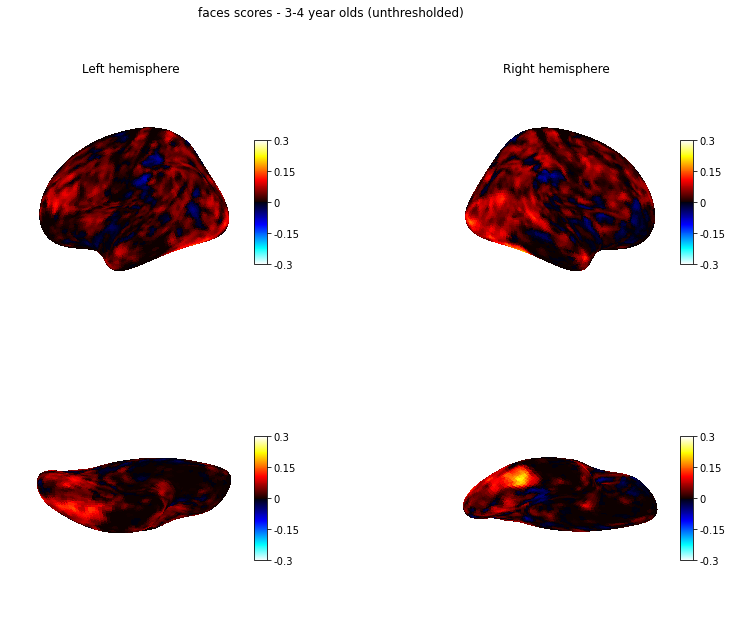

<Figure size 432x288 with 0 Axes>

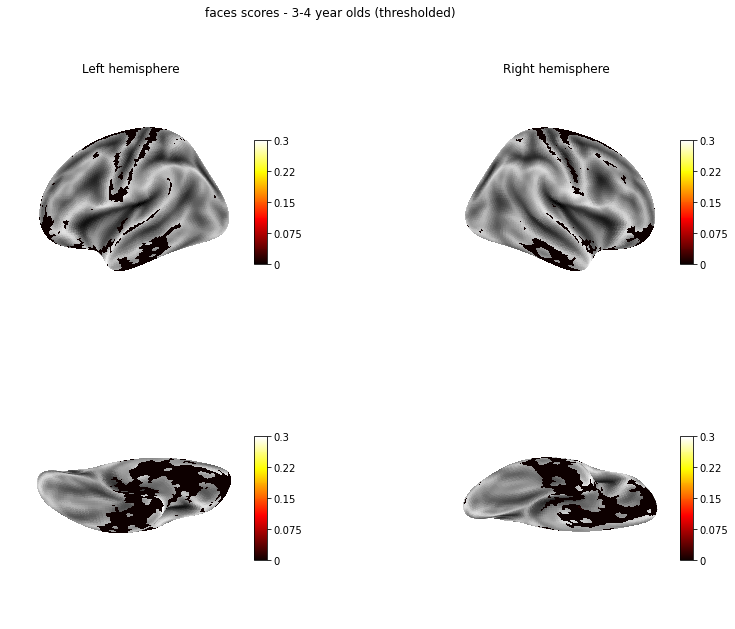

<Figure size 432x288 with 0 Axes>

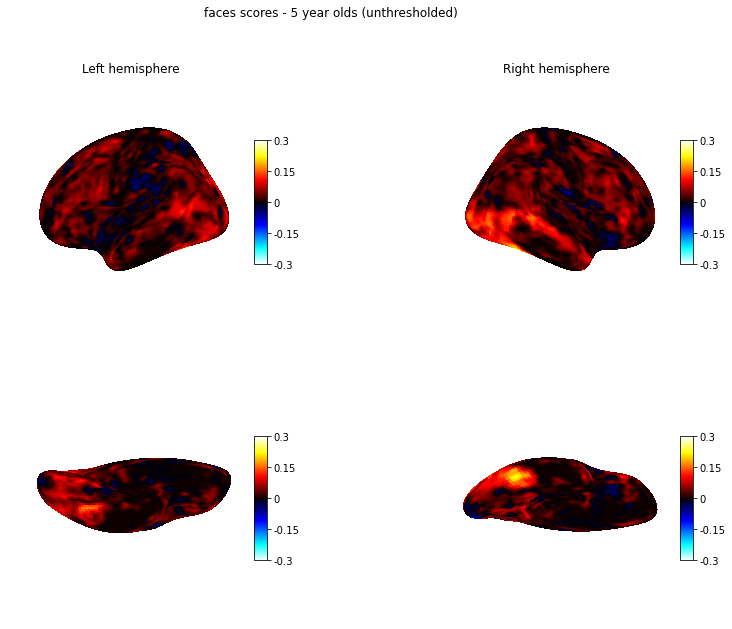

<Figure size 432x288 with 0 Axes>

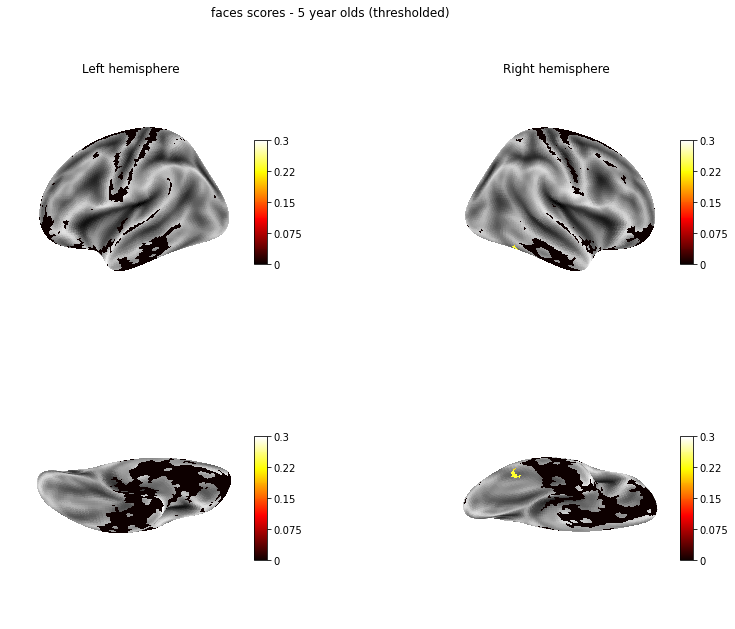

<Figure size 432x288 with 0 Axes>

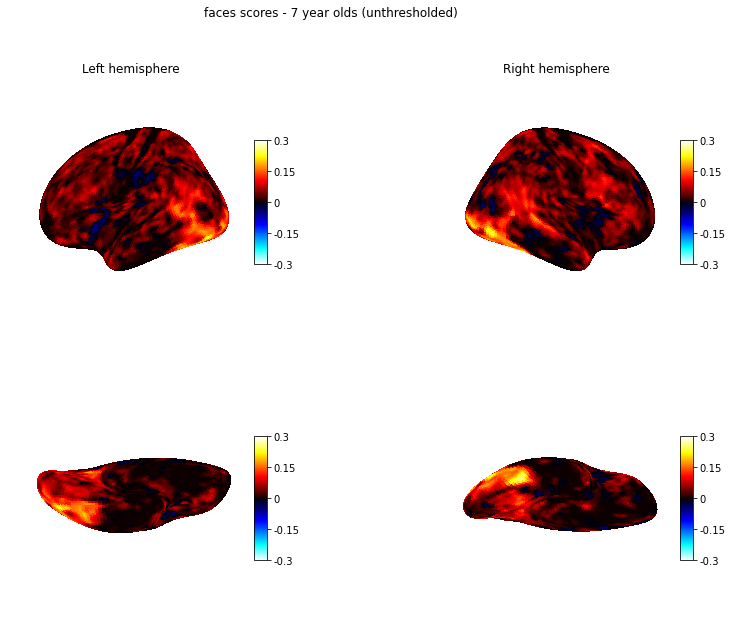

<Figure size 432x288 with 0 Axes>

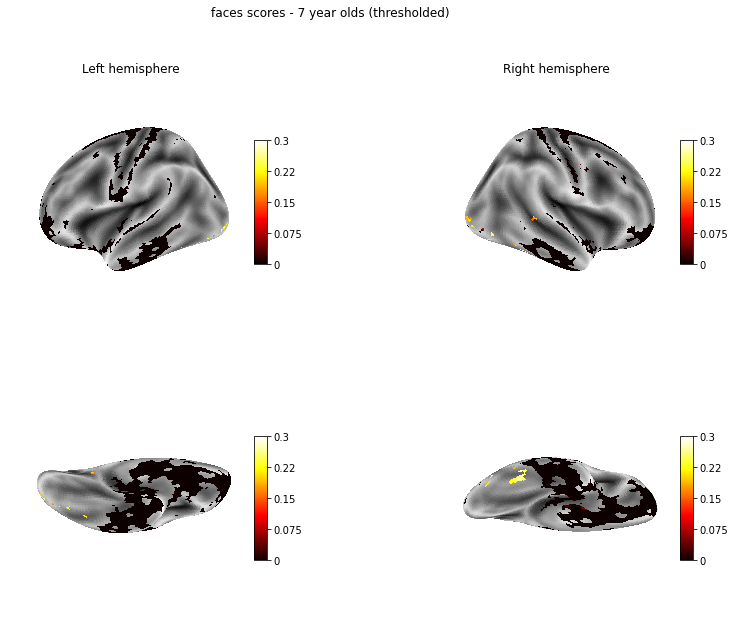

<Figure size 432x288 with 0 Axes>

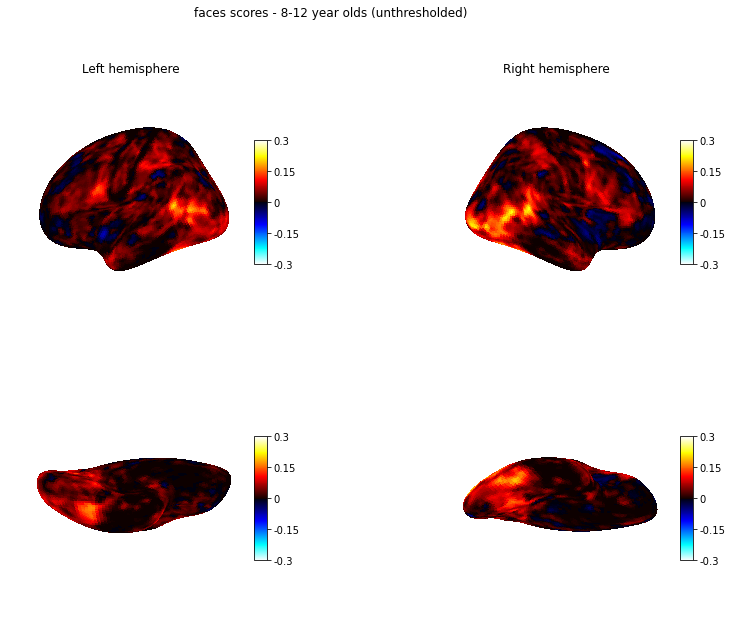

<Figure size 432x288 with 0 Axes>

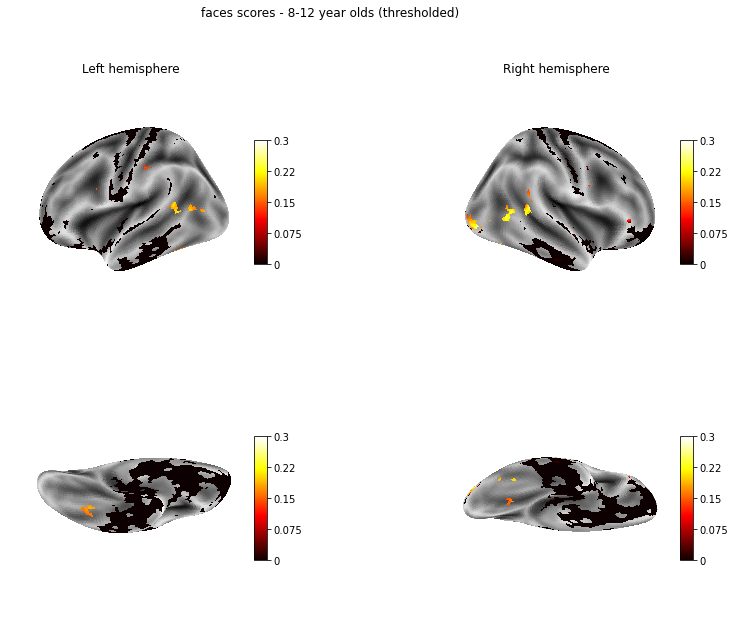

<Figure size 432x288 with 0 Axes>

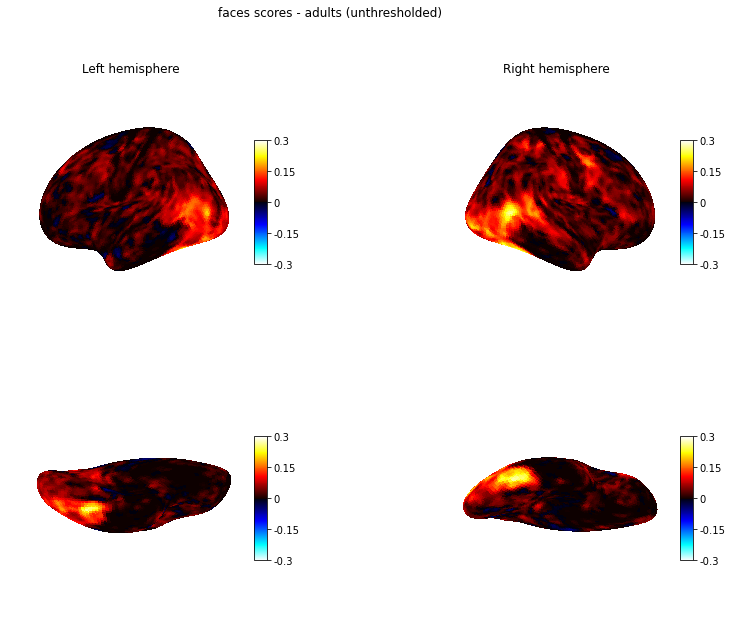

<Figure size 432x288 with 0 Axes>

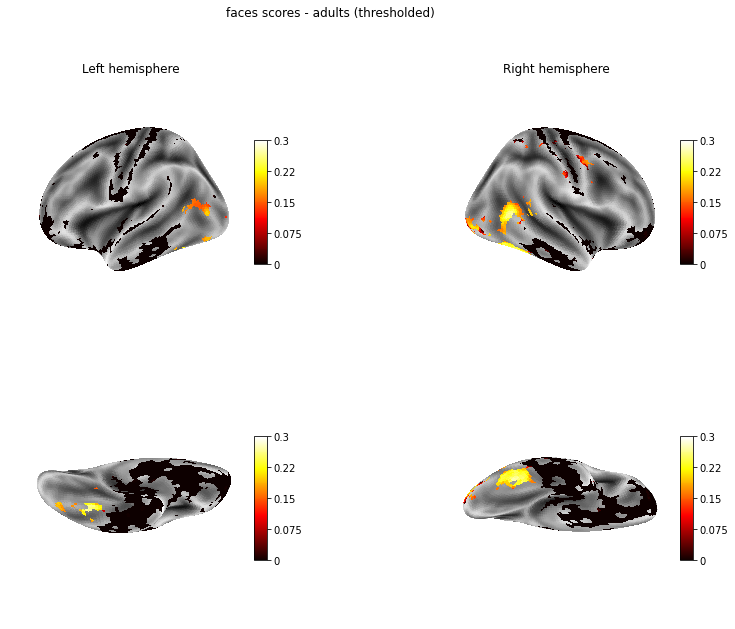

<Figure size 432x288 with 0 Axes>

In [68]:
# 3-4 year olds

plot_surfaces_with_vmax(vol=make_vol(faces_scores_34yrs_unthresholded, mask), 
                            title='faces scores - 3-4 year olds (unthresholded)', 
                            vis_threshold=vis_threshold, vmax=0.3)
#plt.savefig('faces_scores_34u.pdf')
plot_surfaces_with_vmax(vol=make_vol(faces_scores_34yrs_thresholded, mask), 
                            title='faces scores - 3-4 year olds (thresholded)', 
                            vis_threshold=vis_threshold, vmax=0.3)
#plt.savefig('faces_scores_34t.pdf')

# 5 year olds

plot_surfaces_with_vmax(vol=make_vol(faces_scores_5yrs_unthresholded, mask), 
                            title='faces scores - 5 year olds (unthresholded)', 
                            vis_threshold=vis_threshold, vmax=0.3)
#plt.savefig('faces_scores_5u.pdf')
plot_surfaces_with_vmax(vol=make_vol(faces_scores_5yrs_thresholded, mask), 
                            title='faces scores - 5 year olds (thresholded)', 
                            vis_threshold=vis_threshold, vmax=0.3)
#plt.savefig('faces_scores_5t.pdf')

# 7 year olds

plot_surfaces_with_vmax(vol=make_vol(faces_scores_7yrs_unthresholded, mask), 
                            title='faces scores - 7 year olds (unthresholded)', 
                            vis_threshold=vis_threshold, vmax=0.3)
#plt.savefig('faces_scores_7u.pdf')
plot_surfaces_with_vmax(vol=make_vol(faces_scores_7yrs_thresholded, mask), 
                            title='faces scores - 7 year olds (thresholded)', 
                            vis_threshold=vis_threshold, vmax=0.3)
#plt.savefig('faces_scores_7t.pdf')

# 8-12 year olds

plot_surfaces_with_vmax(vol=make_vol(faces_scores_812yrs_unthresholded, mask), 
                            title='faces scores - 8-12 year olds (unthresholded)', 
                            vis_threshold=vis_threshold, vmax=0.3)
#plt.savefig('faces_scores_812u.pdf')

plot_surfaces_with_vmax(vol=make_vol(faces_scores_812yrs_thresholded, mask), 
                            title='faces scores - 8-12 year olds (thresholded)', 
                            vis_threshold=vis_threshold, vmax=0.3)
#plt.savefig('faces_scores_812t.pdf')

# Adults

plot_surfaces_with_vmax(vol=make_vol(faces_scores_adults_unthresholded, mask), 
                            title='faces scores - adults (unthresholded)', 
                            vis_threshold=vis_threshold, vmax=0.3)
#plt.savefig('faces_scores_adultsu.pdf')

plot_surfaces_with_vmax(vol=make_vol(faces_scores_adults_thresholded, mask), 
                            title='faces scores - adults (thresholded)', 
                            vis_threshold=vis_threshold, vmax=0.3)
#plt.savefig('faces_scores_adultst.pdf')

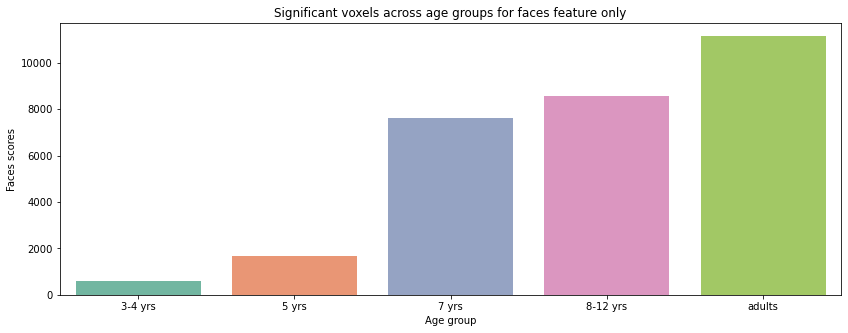

In [17]:
# Significance bar plots

fig = plt.figure(figsize=(14,5))
plt.title('Significant voxels across age groups for faces feature only')
ax = sns.barplot(data=significance_df, x='Age group', y='Faces scores', palette="Set2")
#ax.set_ylim((0, 136543))
plt.savefig('sig_voxels_faces.pdf')
plt.show()

<h1>SI scores</h1>

In [65]:
# Load unthresholded results
interaction_scores_34yrs_unthresholded = np.mean(np.load(os.path.join(
    directory, '3-4-yrs','encoding_results',  'unthresholded_whole', '3-4-yrs_interaction_only_scores_adult_isc_mask.npy')), axis=0)

interaction_scores_5yrs_unthresholded = np.mean(np.load(os.path.join(
    directory, '5-yrs','encoding_results',  'unthresholded', '5-yrs_interaction_only_scores_adult_isc_mask.npy')), axis=0)

interaction_scores_7yrs_unthresholded = np.mean(np.load(os.path.join(
    directory, '7-yrs', 'encoding_results', 'unthresholded', '7-yrs_interaction_only_scores_adult_isc_mask.npy')), axis=0)

interaction_scores_812yrs_unthresholded = np.mean(np.load(os.path.join(
    directory, '8-12-yrs', 'encoding_results', 'unthresholded', '8-12-yrs_interaction_only_scores_adult_isc_mask.npy')), axis=0)

interaction_scores_adults_unthresholded = np.mean(np.load(os.path.join(
    directory, 'adults','encoding_results',  'unthresholded', 'adults_interaction_only_scores_adult_isc_mask.npy')), axis=0)

# Load thresholded scores
interaction_scores_34yrs_thresholded = np.load(os.path.join(
    directory, '3-4-yrs','encoding_results',  'thresholded_whole', '3-4-yrs_interaction_only_scores_adult_isc_mask_thresholded05.npy'))

interaction_scores_5yrs_thresholded = np.load(os.path.join(
    directory, '5-yrs', 'encoding_results', 'thresholded', '5-yrs_interaction_only_scores_adult_isc_mask_thresholded05.npy'))

interaction_scores_7yrs_thresholded = np.load(os.path.join(
    directory, '7-yrs','encoding_results',  'thresholded', '7-yrs_interaction_only_scores_adult_isc_mask_thresholded05.npy'))

interaction_scores_812yrs_thresholded = np.load(os.path.join(
    directory, '8-12-yrs','encoding_results',  'thresholded', '8-12-yrs_interaction_only_scores_adult_isc_mask_thresholded05.npy'))

interaction_scores_adults_thresholded = np.load(os.path.join(
    directory, 'adults','encoding_results',  'thresholded', 'adults_interaction_only_scores_adult_isc_mask_thresholded05.npy'))

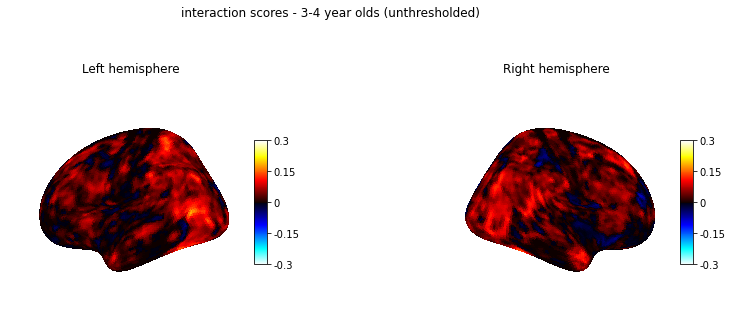

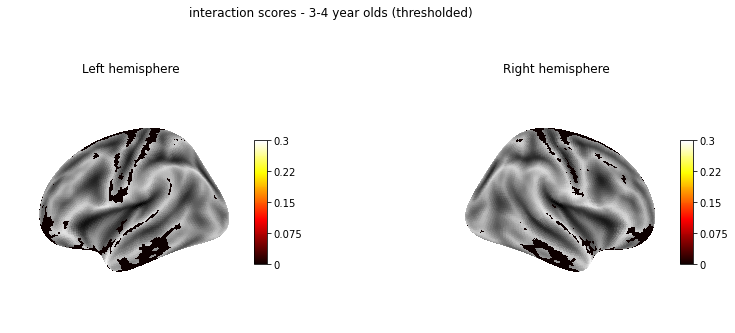

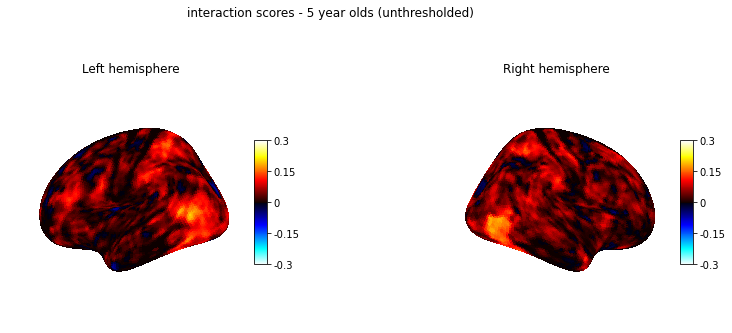

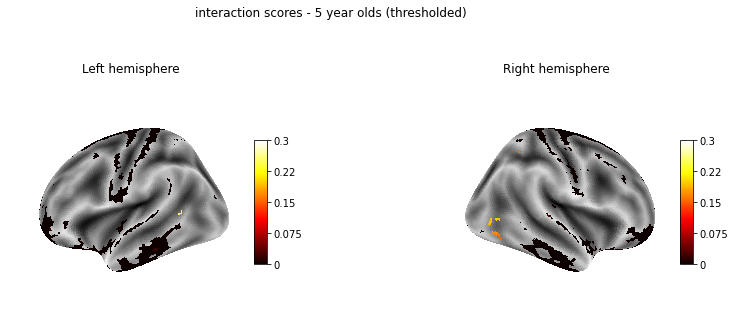

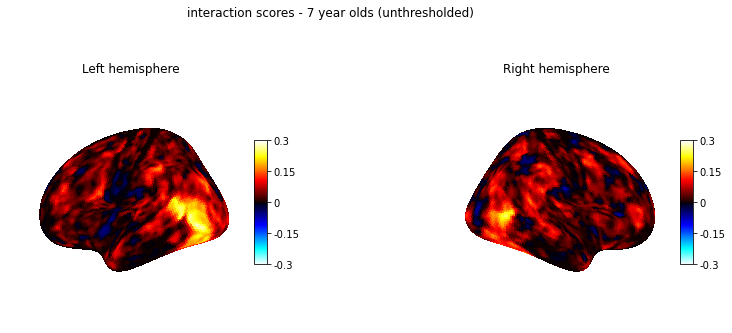

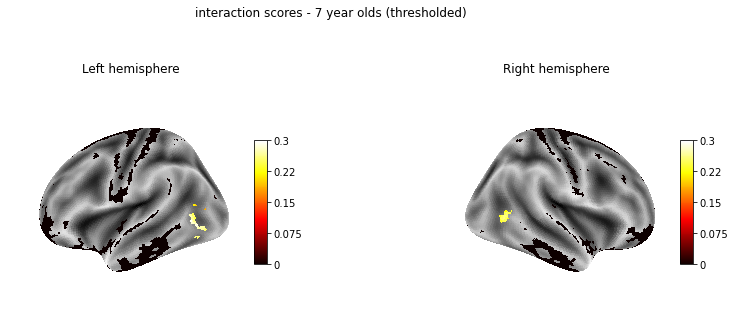

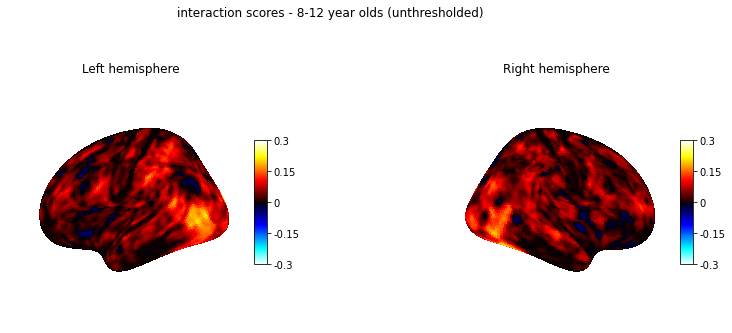

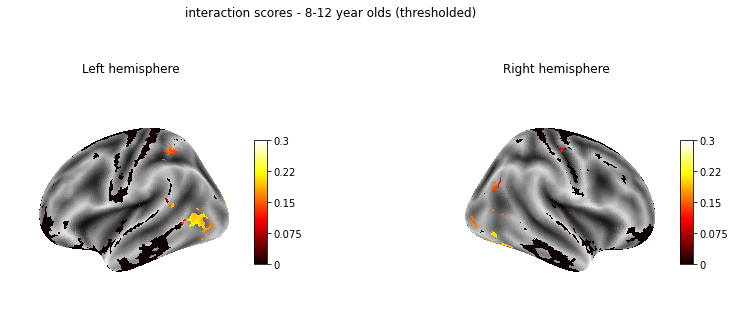

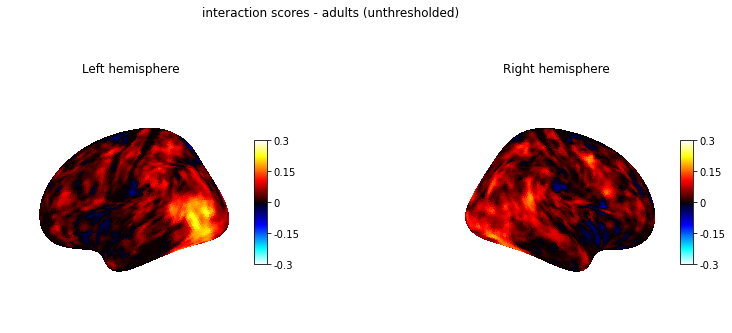

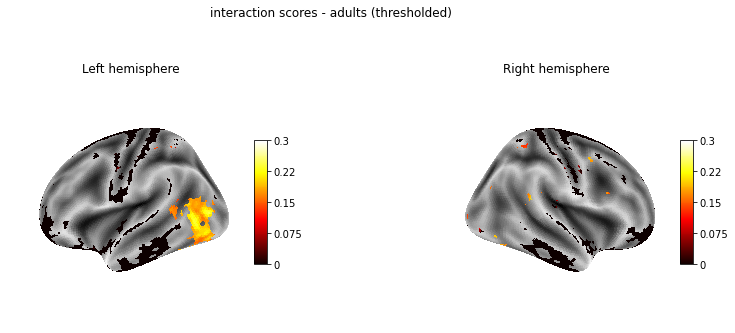

In [67]:
# 3-4 year olds

plot_surfaces_with_vmax(vol=make_vol(interaction_scores_34yrs_unthresholded, mask), 
                            title='interaction scores - 3-4 year olds (unthresholded)', 
                            vis_threshold=vis_threshold, vmax=0.3)
#plt.savefig('SI_scores_34u.pdf')
plot_surfaces_with_vmax(vol=make_vol(interaction_scores_34yrs_thresholded, mask), 
                            title='interaction scores - 3-4 year olds (thresholded)', 
                            vis_threshold=vis_threshold, vmax=0.3)
#plt.savefig('SI_scores_34t.pdf')
# 5 year olds

plot_surfaces_with_vmax(vol=make_vol(interaction_scores_5yrs_unthresholded, mask), 
                            title='interaction scores - 5 year olds (unthresholded)', 
                            vis_threshold=vis_threshold, vmax=0.3)
#plt.savefig('SI_scores_5u.pdf')
plot_surfaces_with_vmax(vol=make_vol(interaction_scores_5yrs_thresholded, mask), 
                            title='interaction scores - 5 year olds (thresholded)', 
                            vis_threshold=vis_threshold, vmax=0.3)
#plt.savefig('SI_scores_5t.pdf')

# 7 year olds

plot_surfaces_with_vmax(vol=make_vol(interaction_scores_7yrs_unthresholded, mask), 
                            title='interaction scores - 7 year olds (unthresholded)', 
                            vis_threshold=vis_threshold, vmax=0.3)
#plt.savefig('SI_scores_7u.pdf')
plot_surfaces_with_vmax(vol=make_vol(interaction_scores_7yrs_thresholded, mask), 
                            title='interaction scores - 7 year olds (thresholded)', 
                            vis_threshold=vis_threshold, vmax=0.3)
#plt.savefig('SI_scores_7t.pdf')
# 8-12 year olds

plot_surfaces_with_vmax(vol=make_vol(interaction_scores_812yrs_unthresholded, mask), 
                            title='interaction scores - 8-12 year olds (unthresholded)', 
                            vis_threshold=vis_threshold, vmax=0.3)
#plt.savefig('SI_scores_812u.pdf')
plot_surfaces_with_vmax(vol=make_vol(interaction_scores_812yrs_thresholded, mask), 
                            title='interaction scores - 8-12 year olds (thresholded)', 
                            vis_threshold=vis_threshold, vmax=0.3)
#plt.savefig('SI_scores_812t.pdf')

# Adults

plot_surfaces_with_vmax(vol=make_vol(interaction_scores_adults_unthresholded, mask), 
                            title='interaction scores - adults (unthresholded)', 
                            vis_threshold=vis_threshold, vmax=0.3)
#plt.savefig('SI_scores_adultsu.pdf')
plot_surfaces_with_vmax(vol=make_vol(interaction_scores_adults_thresholded, mask), 
                            title='interaction scores - adults (thresholded)', 
                            vis_threshold=vis_threshold, vmax=0.3)
#plt.savefig('SI_scores_adultst.pdf')

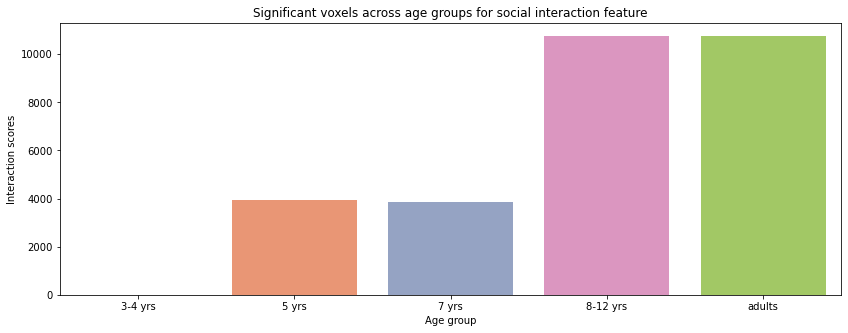

In [18]:
# Significance plots

fig = plt.figure(figsize=(14,5))
plt.title('Significant voxels across age groups for social interaction feature')
ax = sns.barplot(data=significance_df, x='Age group', y='Interaction scores', palette="Set2")
#ax.set_ylim((0, 136543))
plt.savefig('sig_voxels_SI.pdf')
plt.show()

<h1>ToM scores</h1>

In [70]:
# Load unthresholded results
tom_scores_34yrs_unthresholded = np.mean(np.load(os.path.join(
    directory, '3-4-yrs','encoding_results',  'unthresholded_whole', '3-4-yrs_tom_only_scores_adult_isc_mask.npy')), axis=0)

tom_scores_5yrs_unthresholded = np.mean(np.load(os.path.join(
    directory, '5-yrs','encoding_results',  'unthresholded', '5-yrs_tom_only_scores_adult_isc_mask.npy')), axis=0)

tom_scores_7yrs_unthresholded = np.mean(np.load(os.path.join(
    directory, '7-yrs', 'encoding_results', 'unthresholded', '7-yrs_tom_only_scores_adult_isc_mask.npy')), axis=0)

tom_scores_812yrs_unthresholded = np.mean(np.load(os.path.join(
    directory, '8-12-yrs', 'encoding_results', 'unthresholded', '8-12-yrs_tom_only_scores_adult_isc_mask.npy')), axis=0)

tom_scores_adults_unthresholded = np.mean(np.load(os.path.join(
    directory, 'adults','encoding_results',  'unthresholded', 'adults_tom_only_scores_adult_isc_mask.npy')), axis=0)

# Load thresholded scores
tom_scores_34yrs_thresholded = np.load(os.path.join(
    directory, '3-4-yrs','encoding_results',  'thresholded_whole', '3-4-yrs_tom_only_scores_adult_isc_mask_thresholded05.npy'))

tom_scores_5yrs_thresholded = np.load(os.path.join(
    directory, '5-yrs', 'encoding_results', 'thresholded', '5-yrs_tom_only_scores_adult_isc_mask_thresholded05.npy'))

tom_scores_7yrs_thresholded = np.load(os.path.join(
    directory, '7-yrs','encoding_results',  'thresholded', '7-yrs_tom_only_scores_adult_isc_mask_thresholded05.npy'))

tom_scores_812yrs_thresholded = np.load(os.path.join(
    directory, '8-12-yrs','encoding_results',  'thresholded', '8-12-yrs_tom_only_scores_adult_isc_mask_thresholded05.npy'))

tom_scores_adults_thresholded = np.load(os.path.join(
    directory, 'adults','encoding_results',  'thresholded', 'adults_tom_only_scores_adult_isc_mask_thresholded05.npy'))

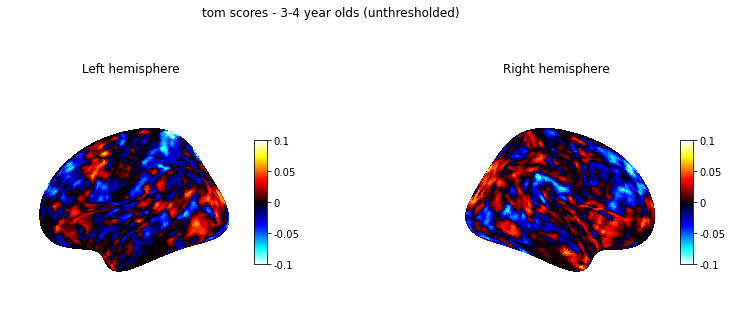

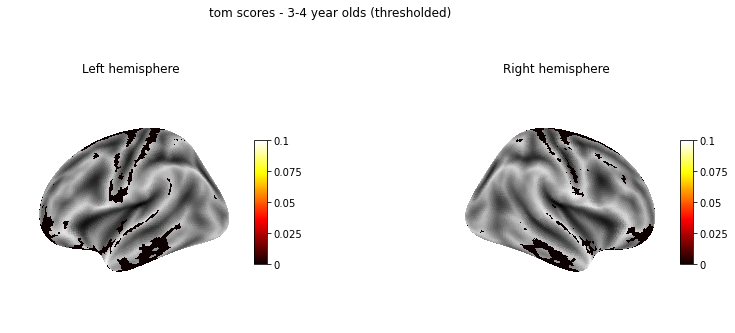

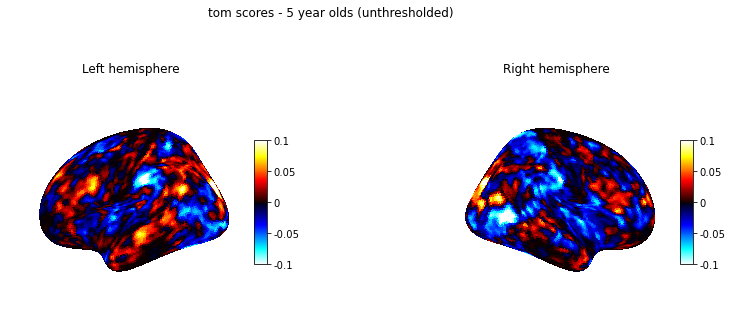

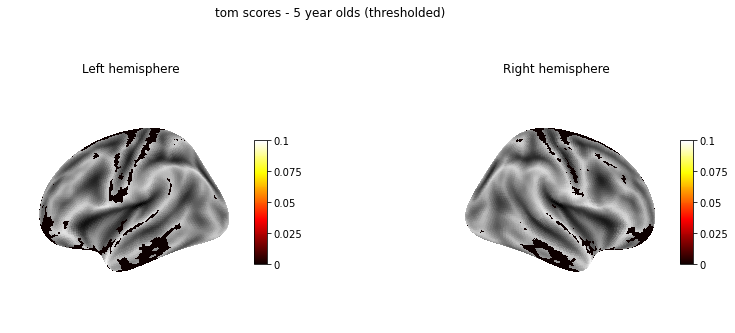

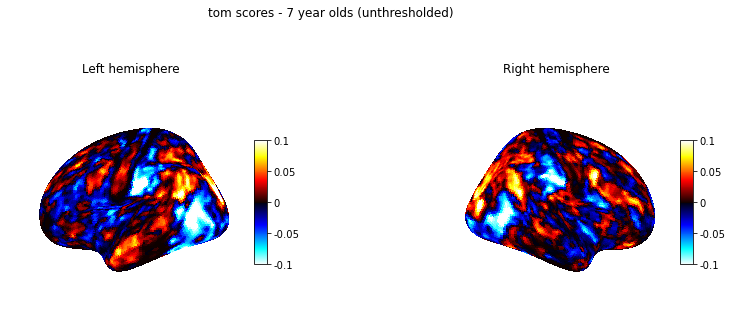

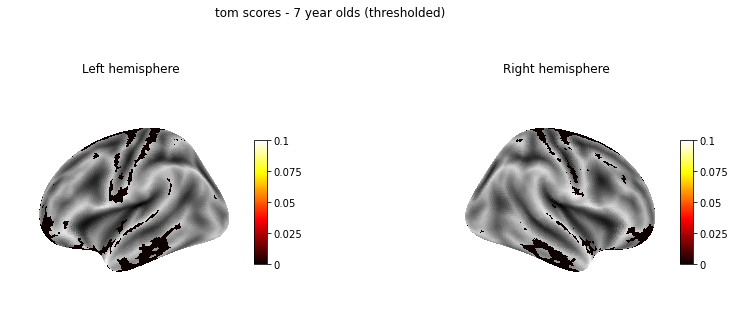

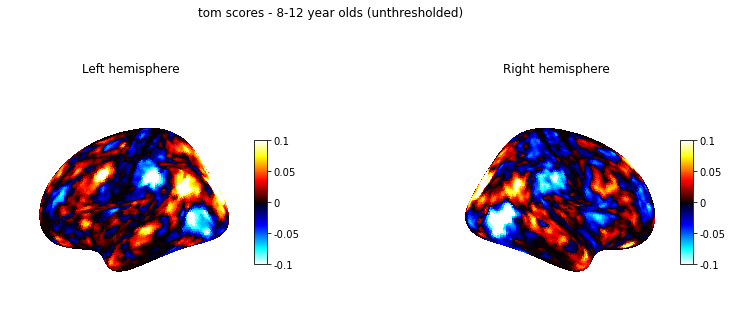

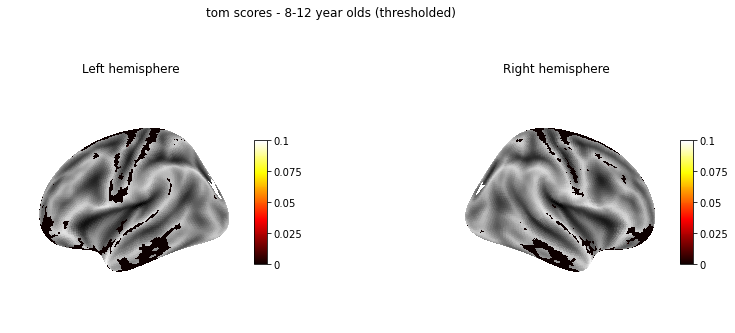

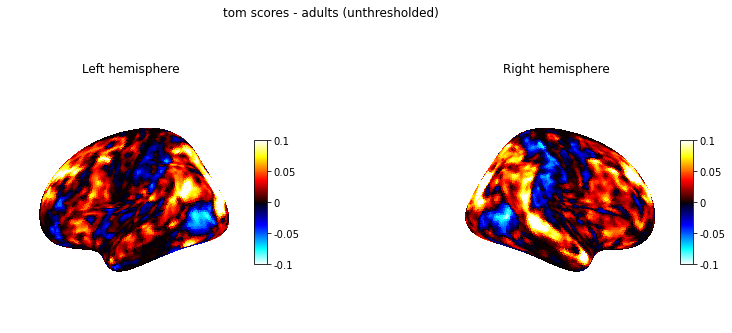

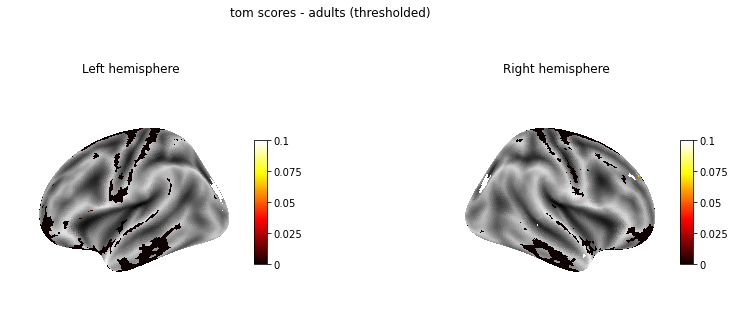

In [72]:
# 3-4 year olds

plot_surfaces_with_vmax(vol=make_vol(tom_scores_34yrs_unthresholded, mask), 
                            title='tom scores - 3-4 year olds (unthresholded)', 
                            vis_threshold=vis_threshold, vmax=0.1)
#plt.savefig('ToM_scores_34u.pdf')
plot_surfaces_with_vmax(vol=make_vol(tom_scores_34yrs_thresholded, mask), 
                            title='tom scores - 3-4 year olds (thresholded)', 
                            vis_threshold=vis_threshold, vmax=0.1)
#plt.savefig('ToM_scores_34t.pdf')

# 5 year olds

plot_surfaces_with_vmax(vol=make_vol(tom_scores_5yrs_unthresholded, mask), 
                            title='tom scores - 5 year olds (unthresholded)', 
                            vis_threshold=vis_threshold, vmax=0.1)
#plt.savefig('ToM_scores_5u.pdf')
plot_surfaces_with_vmax(vol=make_vol(tom_scores_5yrs_thresholded, mask), 
                            title='tom scores - 5 year olds (thresholded)', 
                            vis_threshold=vis_threshold, vmax=0.1)
#plt.savefig('ToM_scores_5t.pdf')

# 7 year olds

plot_surfaces_with_vmax(vol=make_vol(tom_scores_7yrs_unthresholded, mask), 
                            title='tom scores - 7 year olds (unthresholded)', 
                            vis_threshold=vis_threshold, vmax=0.1)
#plt.savefig('ToM_scores_7u.pdf')
plot_surfaces_with_vmax(vol=make_vol(tom_scores_7yrs_thresholded, mask), 
                            title='tom scores - 7 year olds (thresholded)', 
                            vis_threshold=vis_threshold, vmax=0.1)
#plt.savefig('ToM_scores_7t.pdf')

# 8-12 year olds

plot_surfaces_with_vmax(vol=make_vol(tom_scores_812yrs_unthresholded, mask), 
                            title='tom scores - 8-12 year olds (unthresholded)', 
                            vis_threshold=vis_threshold, vmax=0.1)
#plt.savefig('ToM_scores_812u.pdf')

plot_surfaces_with_vmax(vol=make_vol(tom_scores_812yrs_thresholded, mask), 
                            title='tom scores - 8-12 year olds (thresholded)', 
                            vis_threshold=vis_threshold, vmax=0.1)
#plt.savefig('ToM_scores_812t.pdf')

# Adults

plot_surfaces_with_vmax(vol=make_vol(tom_scores_adults_unthresholded, mask), 
                            title='tom scores - adults (unthresholded)', 
                            vis_threshold=vis_threshold, vmax=0.1)
#plt.savefig('ToM_scores_adultsu.pdf')

plot_surfaces_with_vmax(vol=make_vol(tom_scores_adults_thresholded, mask), 
                            title='tom scores - adults (thresholded)', 
                            vis_threshold=vis_threshold, vmax=0.1)
#plt.savefig('ToM_scores_adultst.pdf')

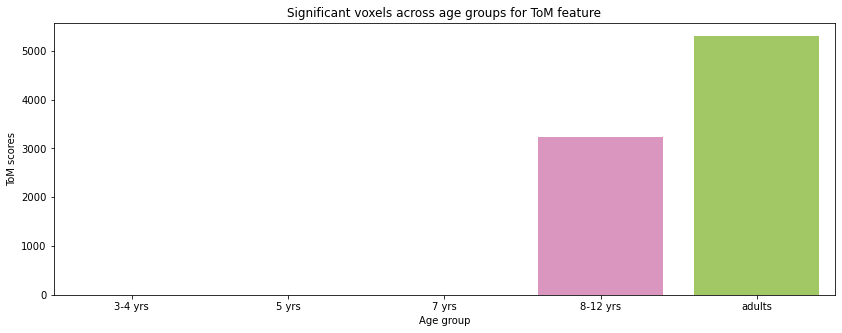

In [19]:
# Significance plots

fig = plt.figure(figsize=(14,5))
plt.title('Significant voxels across age groups for ToM feature')
ax = sns.barplot(data=significance_df, x='Age group', y='ToM scores', palette="Set2")
#ax.set_ylim((0, 136543))
plt.savefig('sig_voxels_ToM.pdf')
plt.show()

<h1>Differences</h1>

<h2>Full scores</h2>

In [10]:
# Load unthresholded differences
full_difference_34yrs_unthresholded = np.load(os.path.join(
    directory, '3-4-yrs', 'encoding_results',  'unthresholded_whole', '3-4-yrs_full_difference_adult_isc_mask.npy'))

full_difference_5yrs_unthresholded = np.load(os.path.join(
    directory, '5-yrs','encoding_results',  'unthresholded', '5-yrs_full_difference_adult_isc_mask.npy'))

full_difference_7yrs_unthresholded = np.load(os.path.join(
    directory, '7-yrs', 'encoding_results', 'unthresholded', '7-yrs_full_difference_adult_isc_mask.npy'))

full_difference_812yrs_unthresholded = np.load(os.path.join(
    directory, '8-12-yrs', 'encoding_results', 'unthresholded', '8-12-yrs_full_difference_adult_isc_mask.npy'))

# Load thresholded differences
full_difference_34yrs_thresholded = np.load(os.path.join(
    directory, '3-4-yrs', 'encoding_results',  'thresholded_whole', '3-4-yrs_full_difference_adult_isc_mask_thresholded05.npy'))

full_difference_5yrs_thresholded = np.load(os.path.join(
    directory, '5-yrs','encoding_results',  'thresholded', '5-yrs_full_difference_adult_isc_mask_thresholded05.npy'))

full_difference_7yrs_thresholded = np.load(os.path.join(
    directory, '7-yrs', 'encoding_results', 'thresholded', '7-yrs_full_difference_adult_isc_mask_thresholded05.npy'))

full_difference_812yrs_thresholded = np.load(os.path.join(
    directory, '8-12-yrs', 'encoding_results', 'thresholded', '8-12-yrs_full_difference_adult_isc_mask_thresholded05.npy'))

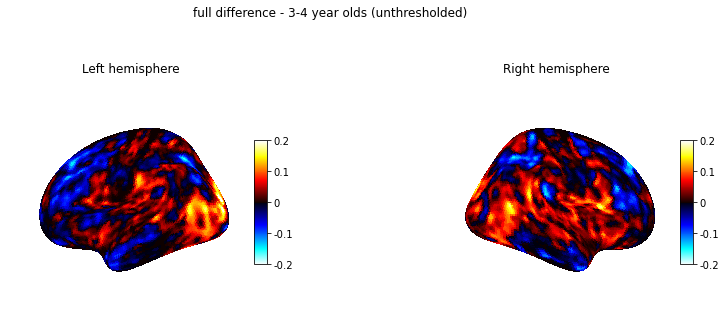

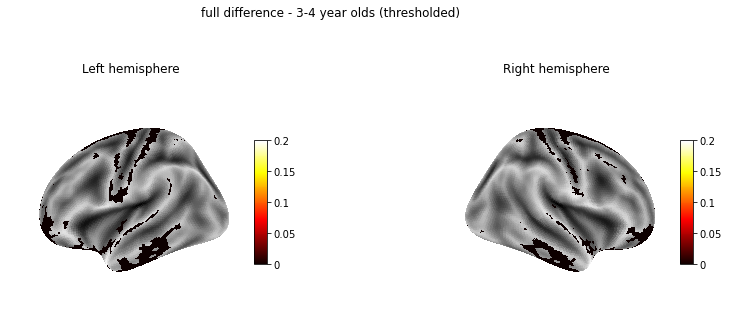

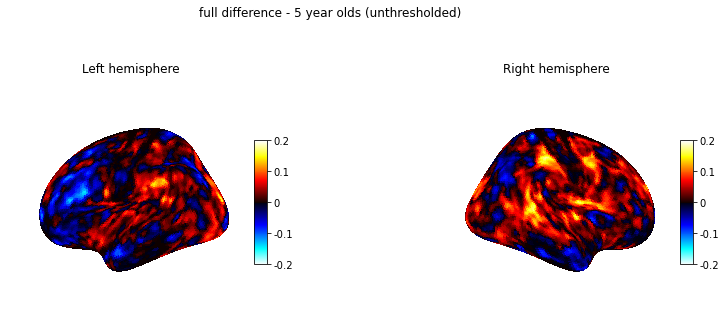

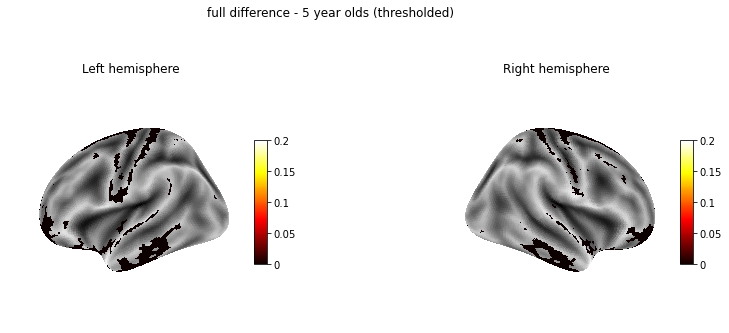

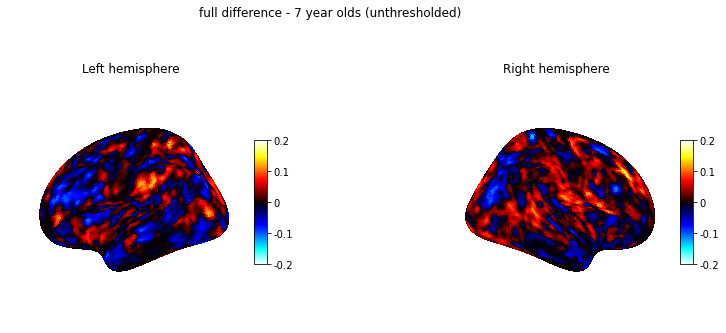

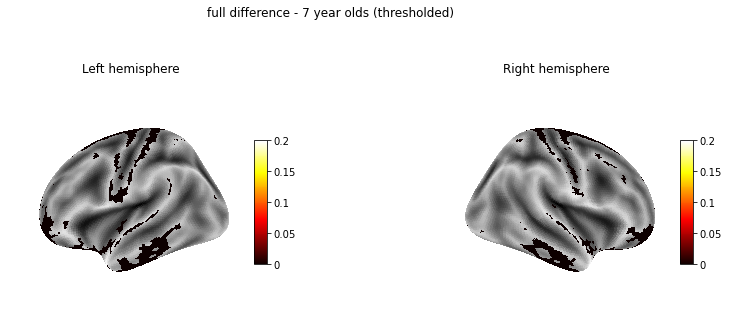

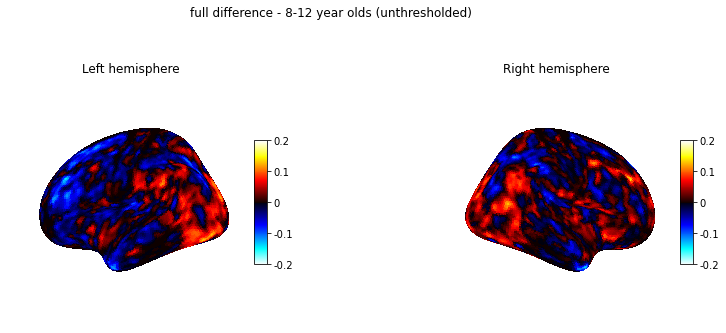

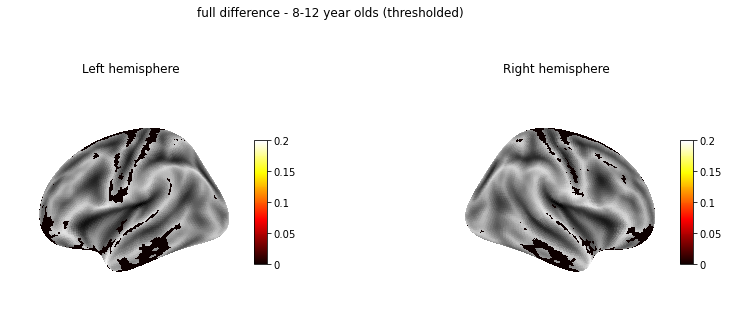

In [11]:
# 3-4 year olds
plot_surfaces_with_vmax(vol=make_vol(full_difference_34yrs_unthresholded, mask), 
                            title='full difference - 3-4 year olds (unthresholded)', 
                            vis_threshold=vis_threshold, vmax=0.2)
# 3-4 year olds
plot_surfaces_with_vmax(vol=make_vol(full_difference_34yrs_thresholded, mask), 
                            title='full difference - 3-4 year olds (thresholded)', 
                            vis_threshold=vis_threshold, vmax=0.2)

# 5 year olds
plot_surfaces_with_vmax(vol=make_vol(full_difference_5yrs_unthresholded, mask), 
                            title='full difference - 5 year olds (unthresholded)', 
                            vis_threshold=vis_threshold, vmax=0.2)
# 5 year olds
plot_surfaces_with_vmax(vol=make_vol(full_difference_5yrs_thresholded, mask), 
                            title='full difference - 5 year olds (thresholded)', 
                            vis_threshold=vis_threshold, vmax=0.2)


# 7 year olds
plot_surfaces_with_vmax(vol=make_vol(full_difference_7yrs_unthresholded, mask), 
                            title='full difference - 7 year olds (unthresholded)', 
                            vis_threshold=vis_threshold, vmax=0.2)
# 7 year olds
plot_surfaces_with_vmax(vol=make_vol(full_difference_7yrs_thresholded, mask), 
                            title='full difference - 7 year olds (thresholded)', 
                            vis_threshold=vis_threshold, vmax=0.2)


# 8-12 year olds
plot_surfaces_with_vmax(vol=make_vol(full_difference_812yrs_unthresholded, mask), 
                            title='full difference - 8-12 year olds (unthresholded)', 
                            vis_threshold=vis_threshold, vmax=0.2)
# 8-12 year olds
plot_surfaces_with_vmax(vol=make_vol(full_difference_812yrs_thresholded, mask), 
                            title='full difference - 8-12 year olds (thresholded)', 
                            vis_threshold=vis_threshold, vmax=0.2)

<h2>Motion energy scores</h2>

In [13]:
# Load unthresholded differences
moten_difference_34yrs_unthresholded = np.load(os.path.join(
    directory, '3-4-yrs', 'encoding_results', 'unthresholded_whole', '3-4-yrs_moten_difference_adult_isc_mask.npy'))

moten_difference_5yrs_unthresholded = np.load(os.path.join(
    directory, '5-yrs', 'encoding_results', 'unthresholded', '5-yrs_moten_difference_adult_isc_mask.npy'))

moten_difference_7yrs_unthresholded = np.load(os.path.join(
    directory, '7-yrs', 'encoding_results', 'unthresholded', '7-yrs_moten_difference_adult_isc_mask.npy'))

moten_difference_812yrs_unthresholded = np.load(os.path.join(
    directory, '8-12-yrs', 'encoding_results', 'unthresholded', '8-12-yrs_moten_difference_adult_isc_mask.npy'))

# Load thresholded differences
moten_difference_34yrs_thresholded = np.load(os.path.join(
    directory, '3-4-yrs', 'encoding_results', 'thresholded_whole', '3-4-yrs_moten_difference_adult_isc_mask_thresholded05.npy'))

moten_difference_5yrs_thresholded = np.load(os.path.join(
    directory, '5-yrs', 'encoding_results', 'thresholded', '5-yrs_moten_difference_adult_isc_mask_thresholded05.npy'))

moten_difference_7yrs_thresholded = np.load(os.path.join(
    directory, '7-yrs', 'encoding_results', 'thresholded', '7-yrs_moten_difference_adult_isc_mask_thresholded05.npy'))

moten_difference_812yrs_thresholded = np.load(os.path.join(
    directory, '8-12-yrs', 'encoding_results', 'thresholded', '8-12-yrs_moten_difference_adult_isc_mask_thresholded05.npy'))

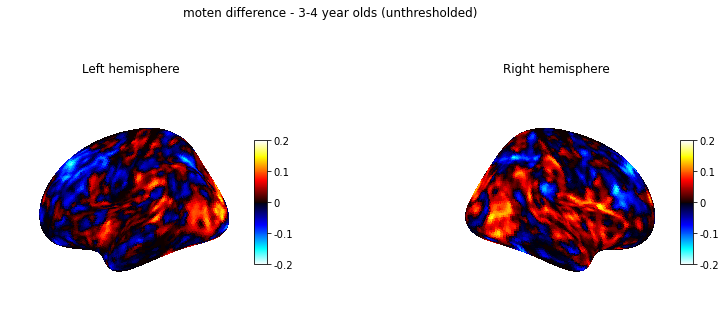

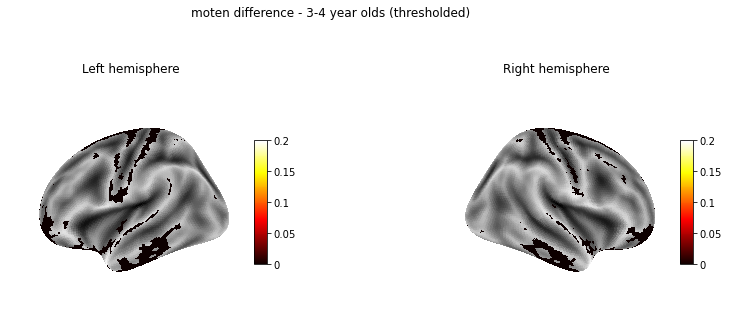

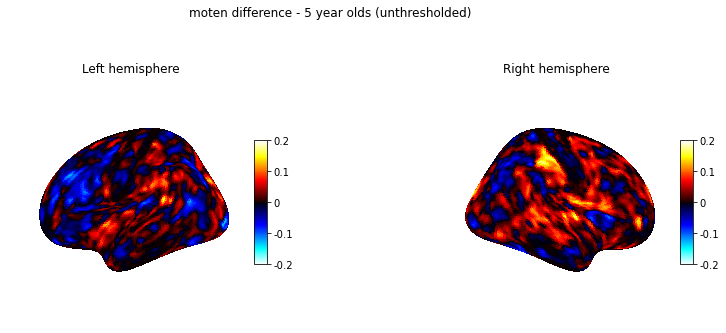

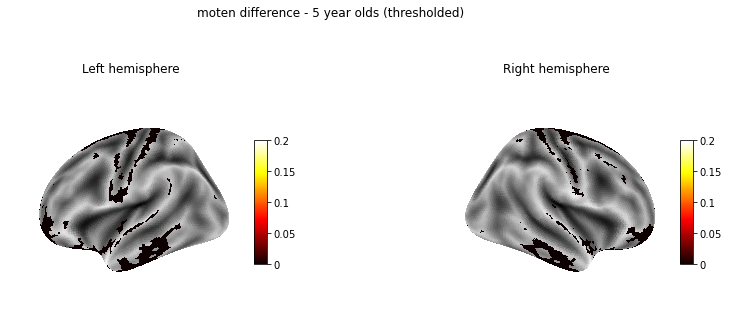

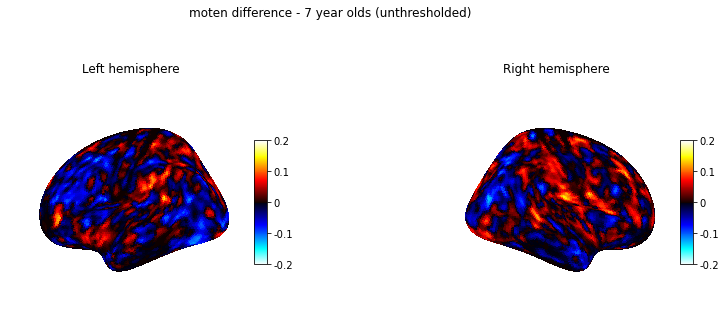

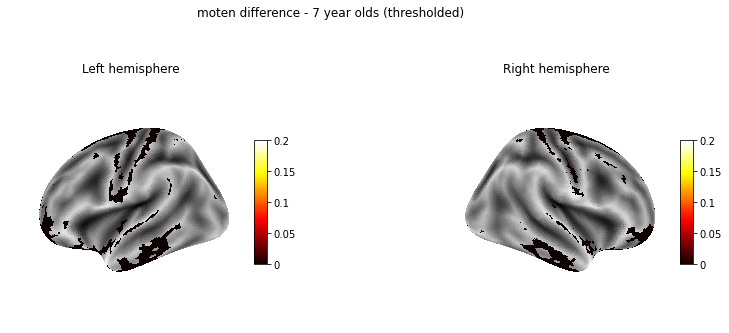

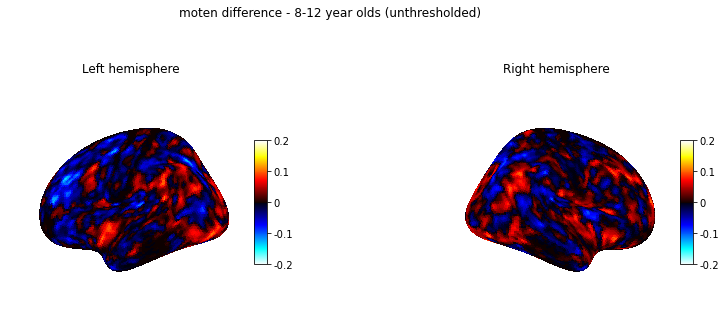

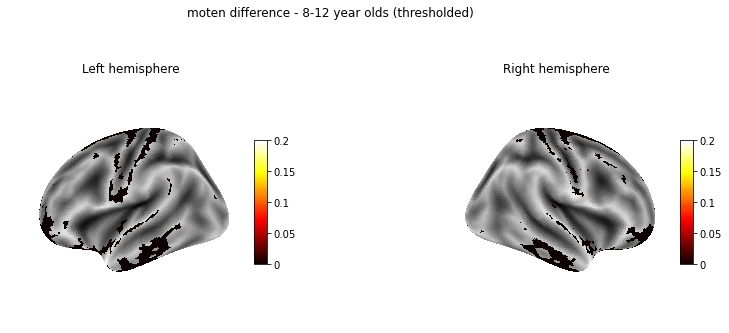

In [14]:
# 3-4 year olds
plot_surfaces_with_vmax(vol=make_vol(moten_difference_34yrs_unthresholded, mask), 
                            title='moten difference - 3-4 year olds (unthresholded)', 
                            vis_threshold=vis_threshold, vmax=0.2)
plot_surfaces_with_vmax(vol=make_vol(moten_difference_34yrs_thresholded, mask), 
                            title='moten difference - 3-4 year olds (thresholded)', 
                            vis_threshold=vis_threshold, vmax=0.2)

# 5 year olds
plot_surfaces_with_vmax(vol=make_vol(moten_difference_5yrs_unthresholded, mask), 
                            title='moten difference - 5 year olds (unthresholded)', 
                            vis_threshold=vis_threshold, vmax=0.2)
plot_surfaces_with_vmax(vol=make_vol(moten_difference_5yrs_thresholded, mask), 
                            title='moten difference - 5 year olds (thresholded)', 
                            vis_threshold=vis_threshold, vmax=0.2)

# 7 year olds
plot_surfaces_with_vmax(vol=make_vol(moten_difference_7yrs_unthresholded, mask), 
                            title='moten difference - 7 year olds (unthresholded)', 
                            vis_threshold=vis_threshold, vmax=0.2)
plot_surfaces_with_vmax(vol=make_vol(moten_difference_7yrs_thresholded, mask), 
                            title='moten difference - 7 year olds (thresholded)', 
                            vis_threshold=vis_threshold, vmax=0.2)

# 8-12 year olds
plot_surfaces_with_vmax(vol=make_vol(moten_difference_812yrs_unthresholded, mask), 
                            title='moten difference - 8-12 year olds (unthresholded)', 
                            vis_threshold=vis_threshold, vmax=0.2)
plot_surfaces_with_vmax(vol=make_vol(moten_difference_812yrs_thresholded, mask), 
                            title='moten difference - 8-12 year olds (thresholded)', 
                            vis_threshold=vis_threshold, vmax=0.2)



<h2>Social scores</h2>

In [16]:
# Load unthresholded differences
social_difference_34yrs_unthresholded = np.load(os.path.join(
    directory, '3-4-yrs', 'encoding_results', 'unthresholded_whole', '3-4-yrs_social_difference_adult_isc_mask.npy'))

social_difference_5yrs_unthresholded = np.load(os.path.join(
    directory, '5-yrs', 'encoding_results', 'unthresholded', '5-yrs_social_difference_adult_isc_mask.npy'))

social_difference_7yrs_unthresholded = np.load(os.path.join(
    directory, '7-yrs','encoding_results',  'unthresholded', '7-yrs_social_difference_adult_isc_mask.npy'))

social_difference_812yrs_unthresholded = np.load(os.path.join(
    directory, '8-12-yrs','encoding_results',  'unthresholded', '8-12-yrs_social_difference_adult_isc_mask.npy'))

# Load thresholded differences
social_difference_34yrs_thresholded = np.load(os.path.join(
    directory, '3-4-yrs', 'encoding_results', 'thresholded_whole', '3-4-yrs_social_difference_adult_isc_mask_thresholded05.npy'))

social_difference_5yrs_thresholded = np.load(os.path.join(
    directory, '5-yrs', 'encoding_results', 'thresholded', '5-yrs_social_difference_adult_isc_mask_thresholded05.npy'))

social_difference_7yrs_thresholded = np.load(os.path.join(
    directory, '7-yrs','encoding_results',  'thresholded', '7-yrs_social_difference_adult_isc_mask_thresholded05.npy'))

social_difference_812yrs_thresholded = np.load(os.path.join(
    directory, '8-12-yrs','encoding_results',  'thresholded', '8-12-yrs_social_difference_adult_isc_mask_thresholded05.npy'))

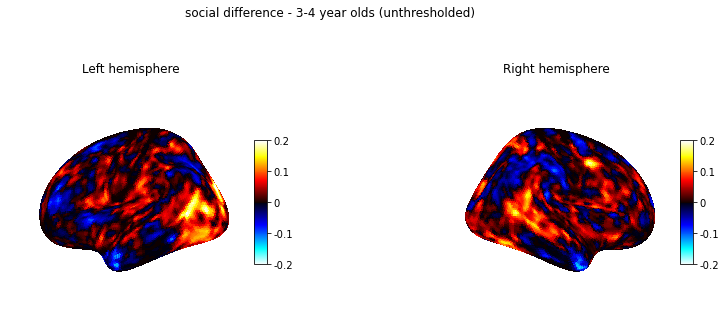

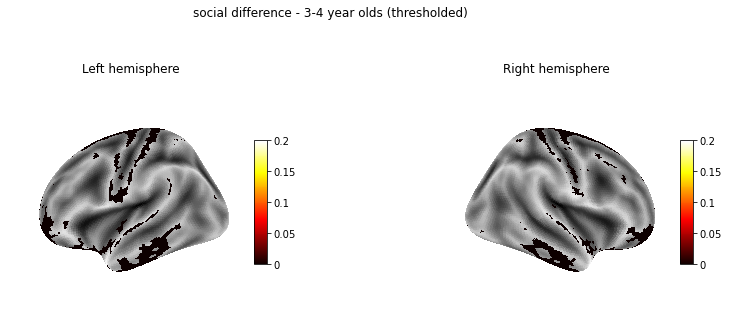

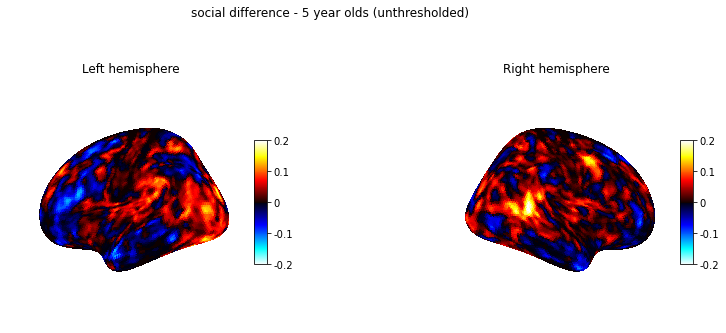

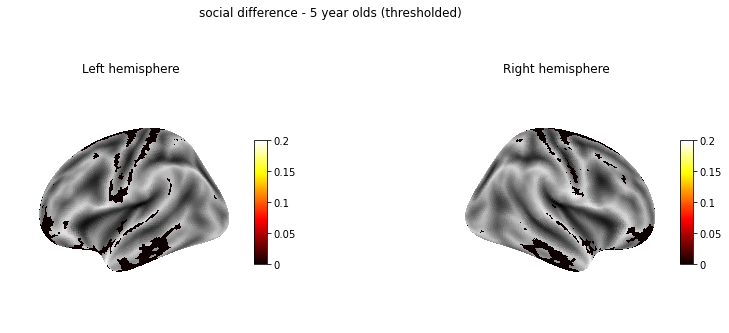

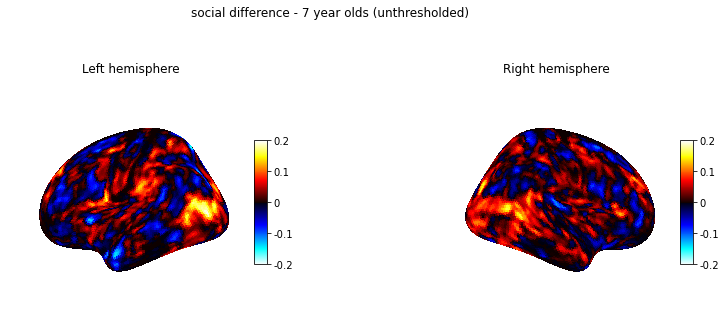

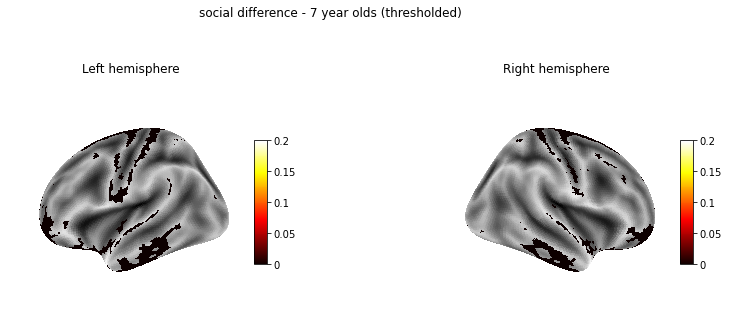

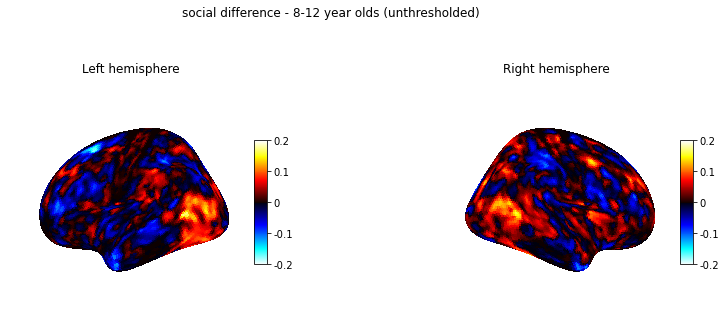

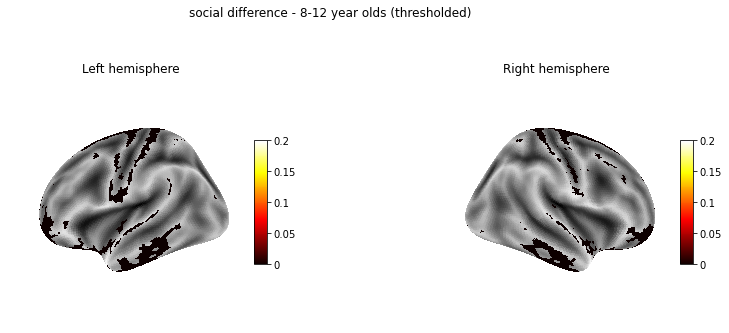

In [17]:
# 3-4 year olds
plot_surfaces_with_vmax(vol=make_vol(social_difference_34yrs_unthresholded, mask), 
                            title='social difference - 3-4 year olds (unthresholded)', 
                            vis_threshold=vis_threshold, vmax=0.2)
plot_surfaces_with_vmax(vol=make_vol(social_difference_34yrs_thresholded, mask), 
                            title='social difference - 3-4 year olds (thresholded)', 
                            vis_threshold=vis_threshold, vmax=0.2)

# 5 year olds
plot_surfaces_with_vmax(vol=make_vol(social_difference_5yrs_unthresholded, mask), 
                            title='social difference - 5 year olds (unthresholded)', 
                            vis_threshold=vis_threshold, vmax=0.2)
plot_surfaces_with_vmax(vol=make_vol(social_difference_5yrs_thresholded, mask), 
                            title='social difference - 5 year olds (thresholded)', 
                            vis_threshold=vis_threshold, vmax=0.2)

# 7 year olds
plot_surfaces_with_vmax(vol=make_vol(social_difference_7yrs_unthresholded, mask), 
                            title='social difference - 7 year olds (unthresholded)', 
                            vis_threshold=vis_threshold, vmax=0.2)
plot_surfaces_with_vmax(vol=make_vol(social_difference_7yrs_thresholded, mask), 
                            title='social difference - 7 year olds (thresholded)', 
                            vis_threshold=vis_threshold, vmax=0.2)

# 8-12 year olds
plot_surfaces_with_vmax(vol=make_vol(social_difference_812yrs_unthresholded, mask), 
                            title='social difference - 8-12 year olds (unthresholded)', 
                            vis_threshold=vis_threshold, vmax=0.2)
plot_surfaces_with_vmax(vol=make_vol(social_difference_812yrs_thresholded, mask), 
                            title='social difference - 8-12 year olds (thresholded)', 
                            vis_threshold=vis_threshold, vmax=0.2)


<h2>Faces scores</h2>

In [18]:
# Load unthresholded differences
faces_difference_34yrs_unthresholded = np.load(os.path.join(
    directory, '3-4-yrs', 'encoding_results', 'unthresholded_whole', '3-4-yrs_faces_difference_adult_isc_mask.npy'))

faces_difference_5yrs_unthresholded = np.load(os.path.join(
    directory, '5-yrs', 'encoding_results', 'unthresholded', '5-yrs_faces_difference_adult_isc_mask.npy'))

faces_difference_7yrs_unthresholded = np.load(os.path.join(
    directory, '7-yrs', 'encoding_results', 'unthresholded', '7-yrs_faces_difference_adult_isc_mask.npy'))

faces_difference_812yrs_unthresholded = np.load(os.path.join(
    directory, '8-12-yrs','encoding_results',  'unthresholded', '8-12-yrs_faces_difference_adult_isc_mask.npy'))

# Load thresholded differences
faces_difference_34yrs_thresholded = np.load(os.path.join(
    directory, '3-4-yrs', 'encoding_results', 'thresholded_whole', '3-4-yrs_faces_difference_adult_isc_mask_thresholded05.npy'))

faces_difference_5yrs_thresholded = np.load(os.path.join(
    directory, '5-yrs', 'encoding_results', 'thresholded', '5-yrs_faces_difference_adult_isc_mask_thresholded05.npy'))

faces_difference_7yrs_thresholded = np.load(os.path.join(
    directory, '7-yrs', 'encoding_results', 'thresholded', '7-yrs_faces_difference_adult_isc_mask_thresholded05.npy'))

faces_difference_812yrs_thresholded = np.load(os.path.join(
    directory, '8-12-yrs','encoding_results',  'thresholded', '8-12-yrs_faces_difference_adult_isc_mask_thresholded05.npy'))

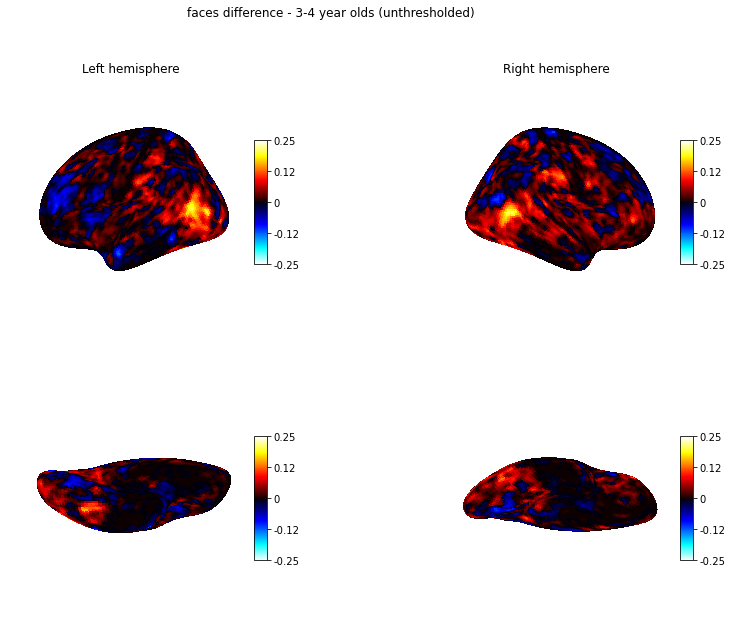

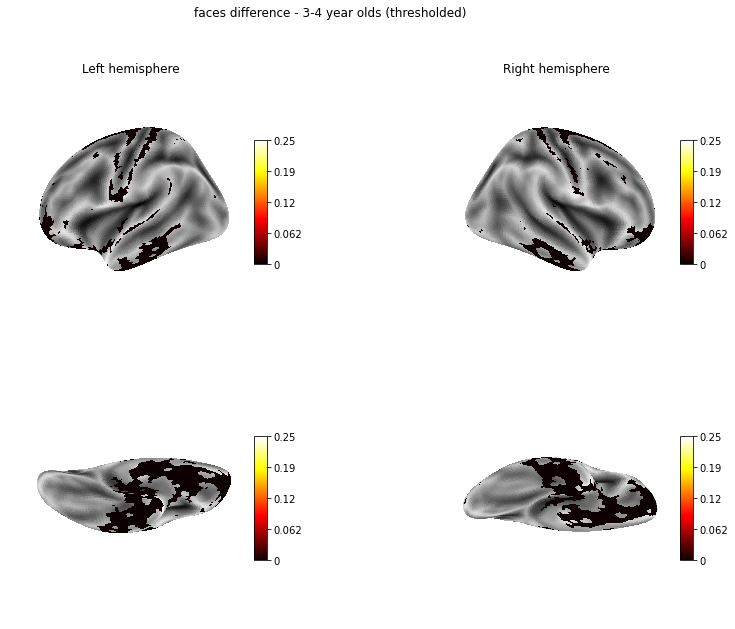

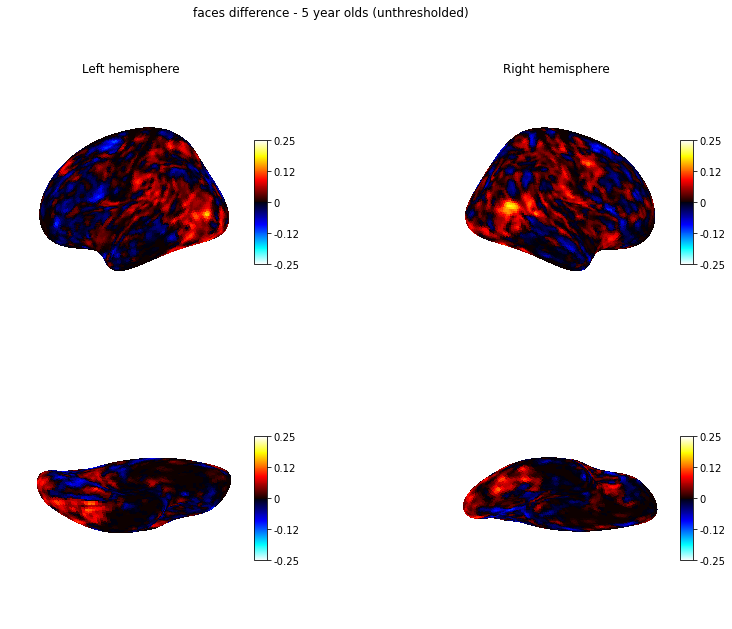

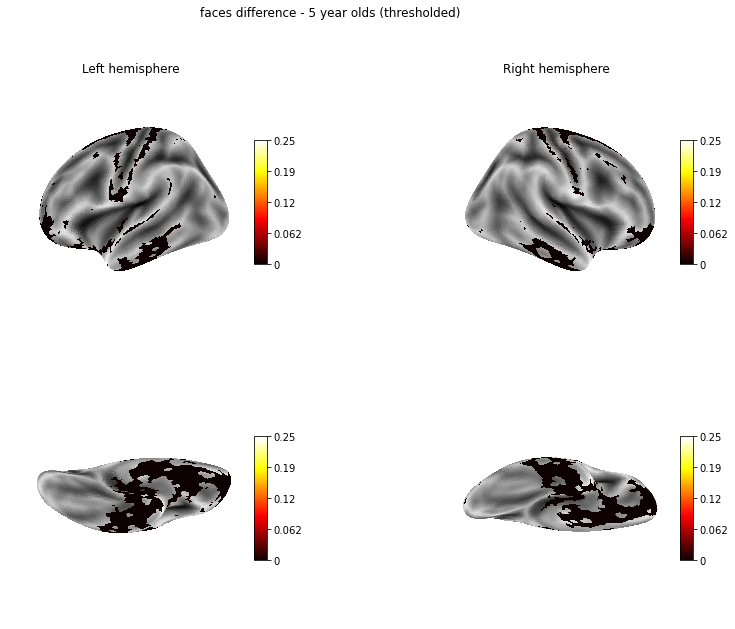

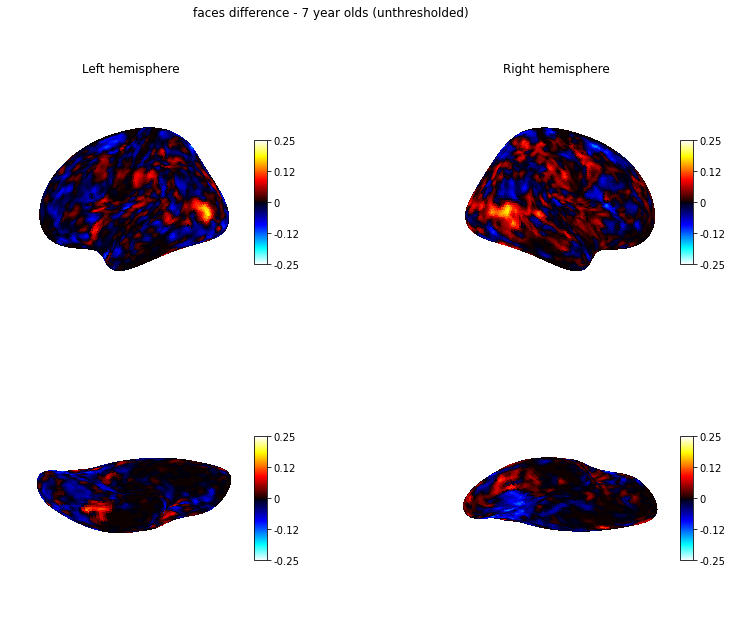

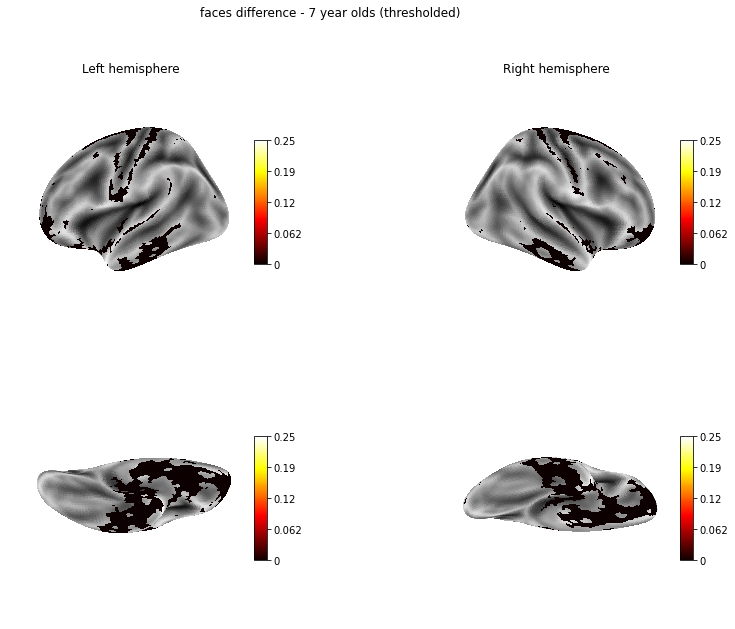

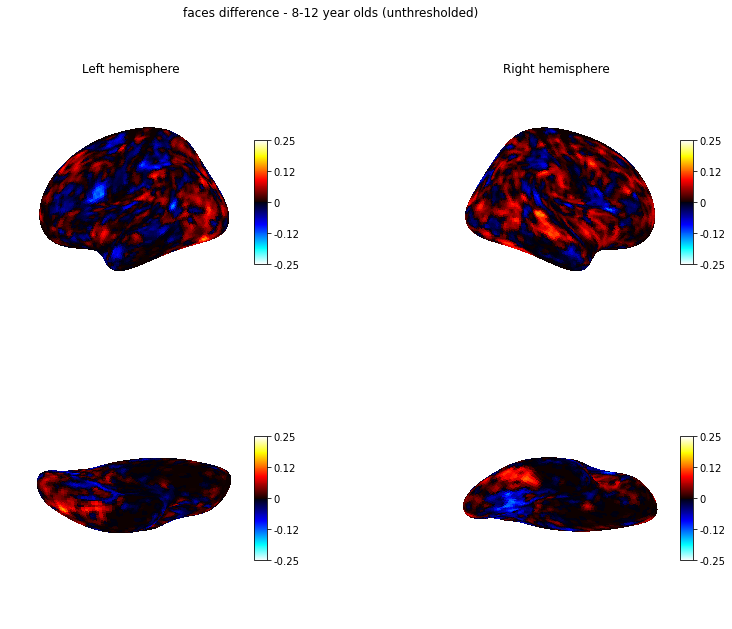

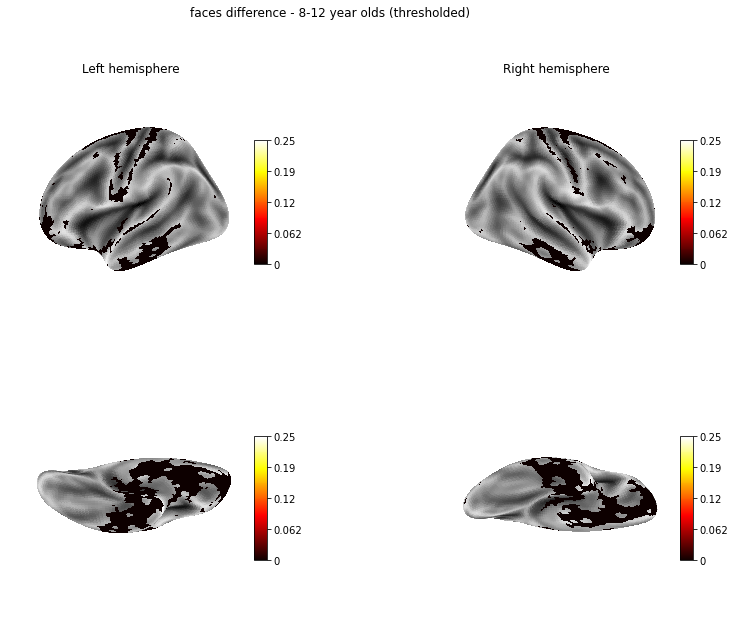

In [19]:
# 3-4 year olds
plot_surfaces_with_vmax(vol=make_vol(faces_difference_34yrs_unthresholded, mask), 
                            title='faces difference - 3-4 year olds (unthresholded)', 
                            vis_threshold=vis_threshold, vmax=0.25)
plot_surfaces_with_vmax(vol=make_vol(faces_difference_34yrs_thresholded, mask), 
                            title='faces difference - 3-4 year olds (thresholded)', 
                            vis_threshold=vis_threshold, vmax=0.25)
# 5 year olds
plot_surfaces_with_vmax(vol=make_vol(faces_difference_5yrs_unthresholded, mask), 
                            title='faces difference - 5 year olds (unthresholded)', 
                            vis_threshold=vis_threshold, vmax=0.25)
plot_surfaces_with_vmax(vol=make_vol(faces_difference_5yrs_thresholded, mask), 
                            title='faces difference - 5 year olds (thresholded)', 
                            vis_threshold=vis_threshold, vmax=0.25)
# 7 year olds
plot_surfaces_with_vmax(vol=make_vol(faces_difference_7yrs_unthresholded, mask), 
                            title='faces difference - 7 year olds (unthresholded)', 
                            vis_threshold=vis_threshold, vmax=0.25)
plot_surfaces_with_vmax(vol=make_vol(faces_difference_7yrs_thresholded, mask), 
                            title='faces difference - 7 year olds (thresholded)', 
                            vis_threshold=vis_threshold, vmax=0.25)

# 8-12 year olds
plot_surfaces_with_vmax(vol=make_vol(faces_difference_812yrs_unthresholded, mask), 
                            title='faces difference - 8-12 year olds (unthresholded)', 
                            vis_threshold=vis_threshold, vmax=0.25)
plot_surfaces_with_vmax(vol=make_vol(faces_difference_812yrs_thresholded, mask), 
                            title='faces difference - 8-12 year olds (thresholded)', 
                            vis_threshold=vis_threshold, vmax=0.25)

<h2>SI score</h2>

In [20]:
# Load unthresholded differences
interaction_difference_34yrs_unthresholded = np.load(os.path.join(
    directory, '3-4-yrs', 'encoding_results', 'unthresholded_whole', '3-4-yrs_interaction_difference_adult_isc_mask.npy'))

interaction_difference_5yrs_unthresholded = np.load(os.path.join(
    directory, '5-yrs','encoding_results',  'unthresholded', '5-yrs_interaction_difference_adult_isc_mask.npy'))

interaction_difference_7yrs_unthresholded = np.load(os.path.join(
    directory, '7-yrs', 'encoding_results', 'unthresholded', '7-yrs_interaction_difference_adult_isc_mask.npy'))

interaction_difference_812yrs_unthresholded = np.load(os.path.join(
    directory, '8-12-yrs', 'encoding_results', 'unthresholded', '8-12-yrs_interaction_difference_adult_isc_mask.npy'))

# Load thresholded differences
interaction_difference_34yrs_thresholded = np.load(os.path.join(
    directory, '3-4-yrs', 'encoding_results', 'thresholded_whole', '3-4-yrs_interaction_difference_adult_isc_mask_thresholded05.npy'))

interaction_difference_5yrs_thresholded = np.load(os.path.join(
    directory, '5-yrs','encoding_results',  'thresholded', '5-yrs_interaction_difference_adult_isc_mask_thresholded05.npy'))

interaction_difference_7yrs_thresholded = np.load(os.path.join(
    directory, '7-yrs', 'encoding_results', 'thresholded', '7-yrs_interaction_difference_adult_isc_mask_thresholded05.npy'))

interaction_difference_812yrs_thresholded = np.load(os.path.join(
    directory, '8-12-yrs', 'encoding_results', 'thresholded', '8-12-yrs_interaction_difference_adult_isc_mask_thresholded05.npy'))

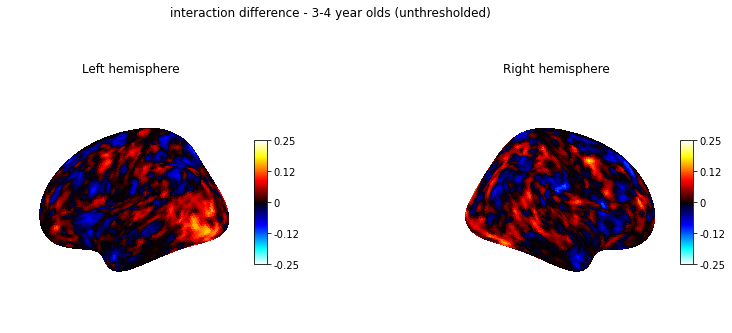

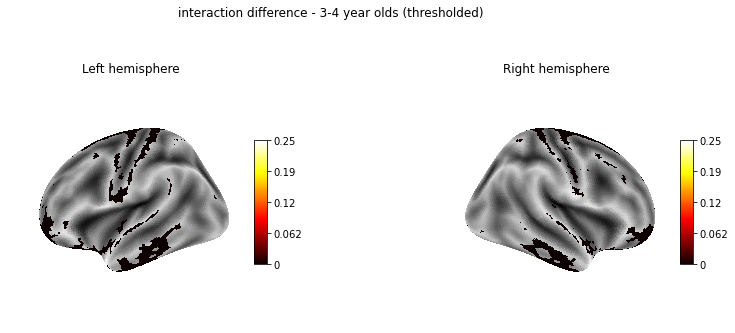

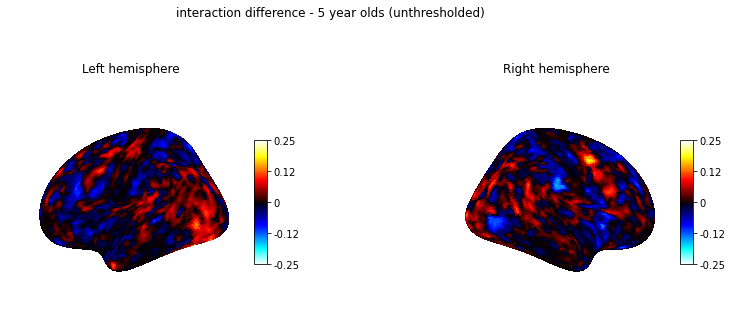

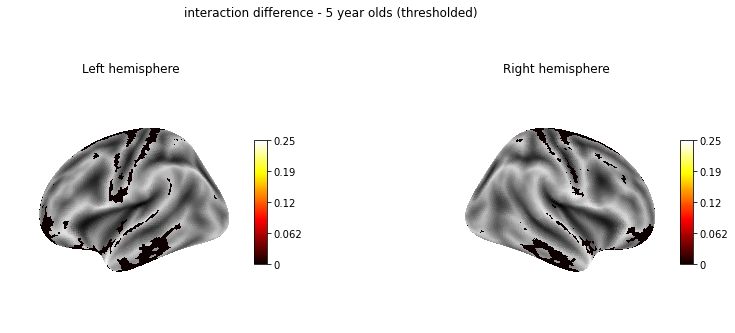

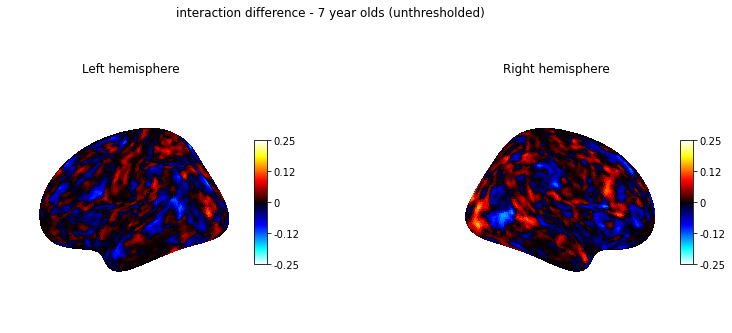

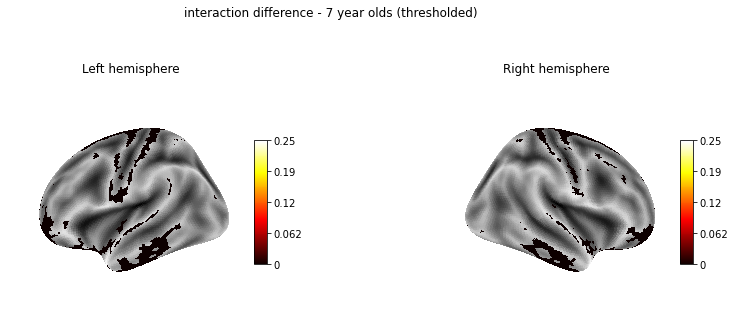

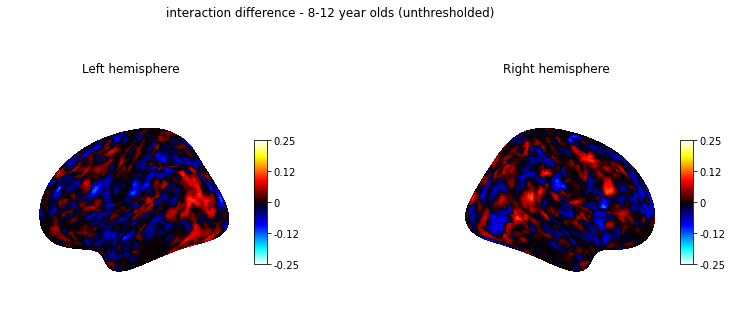

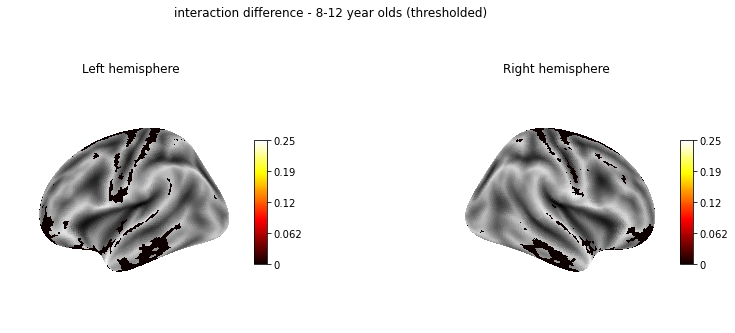

In [21]:
# 3-4 year olds
plot_surfaces_with_vmax(vol=make_vol(interaction_difference_34yrs_unthresholded, mask), 
                            title='interaction difference - 3-4 year olds (unthresholded)', 
                            vis_threshold=vis_threshold, vmax=0.25)
plot_surfaces_with_vmax(vol=make_vol(interaction_difference_34yrs_thresholded, mask), 
                            title='interaction difference - 3-4 year olds (thresholded)', 
                            vis_threshold=vis_threshold, vmax=0.25)


# 5 year olds
plot_surfaces_with_vmax(vol=make_vol(interaction_difference_5yrs_unthresholded, mask), 
                            title='interaction difference - 5 year olds (unthresholded)', 
                            vis_threshold=vis_threshold, vmax=0.25)
plot_surfaces_with_vmax(vol=make_vol(interaction_difference_5yrs_thresholded, mask), 
                            title='interaction difference - 5 year olds (thresholded)', 
                            vis_threshold=vis_threshold, vmax=0.25)

# 7 year olds
plot_surfaces_with_vmax(vol=make_vol(interaction_difference_7yrs_unthresholded, mask), 
                            title='interaction difference - 7 year olds (unthresholded)', 
                            vis_threshold=vis_threshold, vmax=0.25)
plot_surfaces_with_vmax(vol=make_vol(interaction_difference_7yrs_thresholded, mask), 
                            title='interaction difference - 7 year olds (thresholded)', 
                            vis_threshold=vis_threshold, vmax=0.25)
# 8-12 year olds
plot_surfaces_with_vmax(vol=make_vol(interaction_difference_812yrs_unthresholded, mask), 
                            title='interaction difference - 8-12 year olds (unthresholded)', 
                            vis_threshold=vis_threshold, vmax=0.25)
plot_surfaces_with_vmax(vol=make_vol(interaction_difference_812yrs_thresholded, mask), 
                            title='interaction difference - 8-12 year olds (thresholded)', 
                            vis_threshold=vis_threshold, vmax=0.25)

<h2>ToM score</h2>

In [22]:
# Load unthresholded differences
tom_difference_34yrs_unthresholded = np.load(os.path.join(
    directory, '3-4-yrs', 'encoding_results', 'unthresholded_whole', '3-4-yrs_tom_difference_adult_isc_mask.npy'))

tom_difference_5yrs_unthresholded = np.load(os.path.join(
    directory, '5-yrs','encoding_results',  'unthresholded', '5-yrs_tom_difference_adult_isc_mask.npy'))

tom_difference_7yrs_unthresholded = np.load(os.path.join(
    directory, '7-yrs', 'encoding_results', 'unthresholded', '7-yrs_tom_difference_adult_isc_mask.npy'))

tom_difference_812yrs_unthresholded = np.load(os.path.join(
    directory, '8-12-yrs', 'encoding_results', 'unthresholded', '8-12-yrs_tom_difference_adult_isc_mask.npy'))

# Load thresholded differences
tom_difference_34yrs_thresholded = np.load(os.path.join(
    directory, '3-4-yrs', 'encoding_results', 'thresholded_whole', '3-4-yrs_tom_difference_adult_isc_mask_thresholded05.npy'))

tom_difference_5yrs_thresholded = np.load(os.path.join(
    directory, '5-yrs','encoding_results',  'thresholded', '5-yrs_tom_difference_adult_isc_mask_thresholded05.npy'))

tom_difference_7yrs_thresholded = np.load(os.path.join(
    directory, '7-yrs', 'encoding_results', 'thresholded', '7-yrs_tom_difference_adult_isc_mask_thresholded05.npy'))

tom_difference_812yrs_thresholded = np.load(os.path.join(
    directory, '8-12-yrs', 'encoding_results', 'thresholded', '8-12-yrs_tom_difference_adult_isc_mask_thresholded05.npy'))

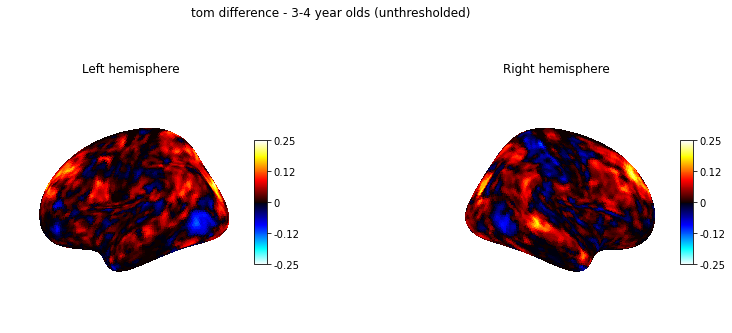

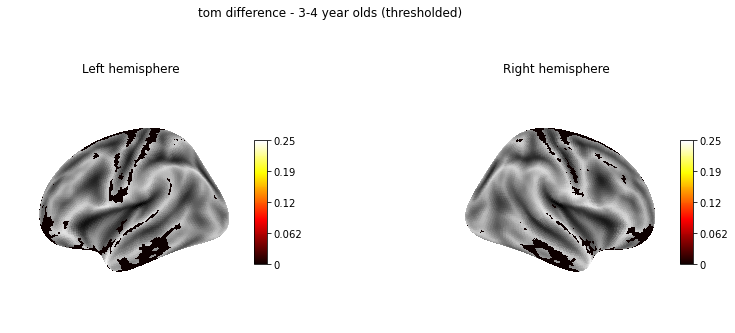

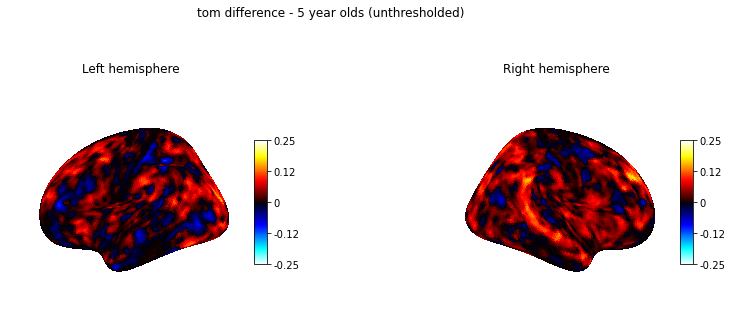

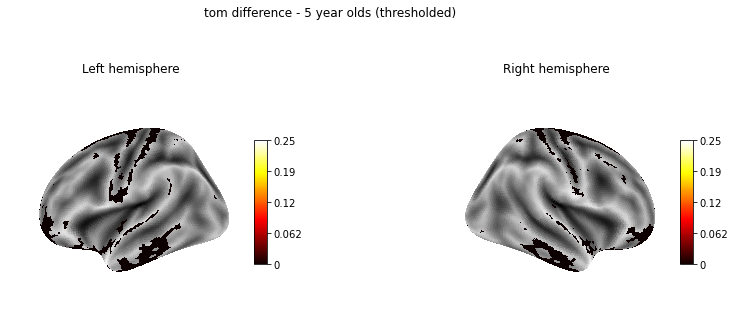

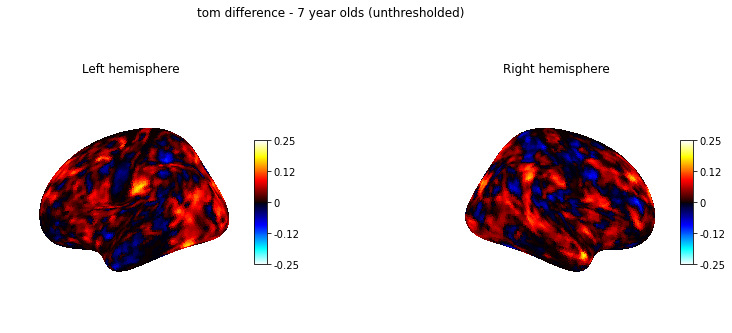

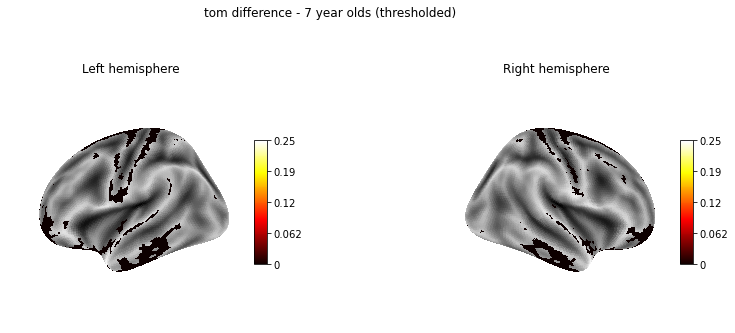

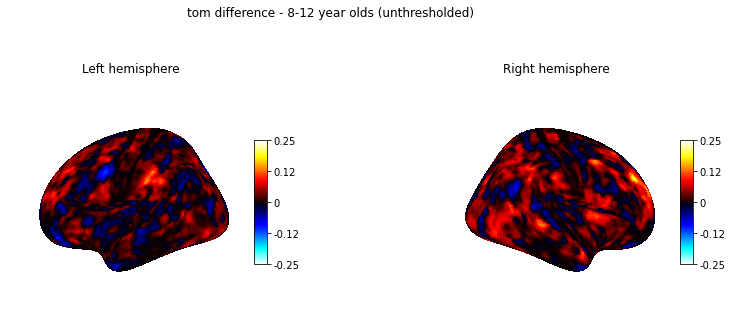

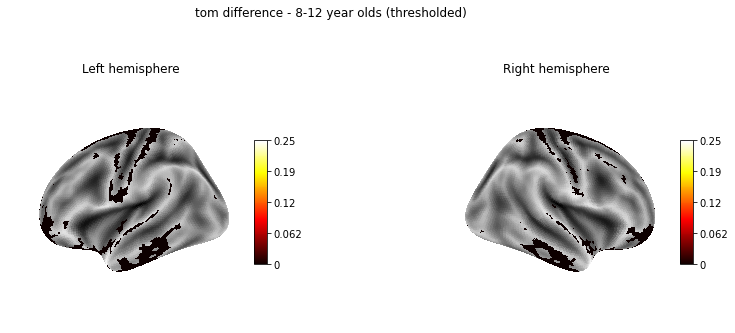

In [23]:
# 3-4 year olds
plot_surfaces_with_vmax(vol=make_vol(tom_difference_34yrs_unthresholded, mask), 
                            title='tom difference - 3-4 year olds (unthresholded)', 
                            vis_threshold=vis_threshold, vmax=0.25)
plot_surfaces_with_vmax(vol=make_vol(tom_difference_34yrs_thresholded, mask), 
                            title='tom difference - 3-4 year olds (thresholded)', 
                            vis_threshold=vis_threshold, vmax=0.25)


# 5 year olds
plot_surfaces_with_vmax(vol=make_vol(tom_difference_5yrs_unthresholded, mask), 
                            title='tom difference - 5 year olds (unthresholded)', 
                            vis_threshold=vis_threshold, vmax=0.25)
plot_surfaces_with_vmax(vol=make_vol(tom_difference_5yrs_thresholded, mask), 
                            title='tom difference - 5 year olds (thresholded)', 
                            vis_threshold=vis_threshold, vmax=0.25)

# 7 year olds
plot_surfaces_with_vmax(vol=make_vol(tom_difference_7yrs_unthresholded, mask), 
                            title='tom difference - 7 year olds (unthresholded)', 
                            vis_threshold=vis_threshold, vmax=0.25)
plot_surfaces_with_vmax(vol=make_vol(tom_difference_7yrs_thresholded, mask), 
                            title='tom difference - 7 year olds (thresholded)', 
                            vis_threshold=vis_threshold, vmax=0.25)
# 8-12 year olds
plot_surfaces_with_vmax(vol=make_vol(tom_difference_812yrs_unthresholded, mask), 
                            title='tom difference - 8-12 year olds (unthresholded)', 
                            vis_threshold=vis_threshold, vmax=0.25)
plot_surfaces_with_vmax(vol=make_vol(tom_difference_812yrs_thresholded, mask), 
                            title='tom difference - 8-12 year olds (thresholded)', 
                            vis_threshold=vis_threshold, vmax=0.25)

<h1>Average correlations</h1>

<h3>Setup</h3>

In [53]:
data = {'Age group': ['3-4 yrs', '5 yrs', '7 yrs', '8-12 yrs', 'adults'], 
       'Full model': [np.nanmean(full_scores_34yrs_thresholded), np.nanmean(full_scores_5yrs_thresholded), np.nanmean(full_scores_7yrs_thresholded), np.nanmean(full_scores_812yrs_thresholded), np.nanmean(full_scores_adults_thresholded)],
       'Motion energy model': [np.nanmean(moten_scores_34yrs_thresholded), np.nanmean(moten_scores_5yrs_thresholded), np.nanmean(moten_scores_7yrs_thresholded), np.nanmean(moten_scores_812yrs_thresholded), np.nanmean(moten_scores_adults_thresholded)],
       'Social model': [np.nanmean(social_scores_34yrs_thresholded), np.nanmean(social_scores_5yrs_thresholded), np.nanmean(social_scores_7yrs_thresholded), np.nanmean(social_scores_812yrs_thresholded), np.nanmean(social_scores_adults_thresholded)],
       'Faces only': [np.nanmean(faces_scores_34yrs_thresholded), np.nanmean(faces_scores_5yrs_thresholded), np.nanmean(faces_scores_7yrs_thresholded), np.nanmean(faces_scores_812yrs_thresholded), np.nanmean(faces_scores_adults_thresholded)],
     'Interaction only': [np.nanmean(interaction_scores_34yrs_thresholded), np.nanmean(interaction_scores_5yrs_thresholded), np.nanmean(interaction_scores_7yrs_thresholded), np.nanmean(interaction_scores_812yrs_thresholded), np.nanmean(interaction_scores_adults_thresholded)],
      'ToM only': [np.nanmean(tom_scores_34yrs_thresholded), np.nanmean(tom_scores_5yrs_thresholded), np.nanmean(tom_scores_7yrs_thresholded), np.nanmean(tom_scores_812yrs_thresholded), np.nanmean(tom_scores_adults_thresholded)]
       }
avg_corr_df = pd.DataFrame(data)

print(avg_corr_df)

  Age group  Full model  Motion energy model  Social model  Faces only  \
0   3-4 yrs    0.208815             0.188186      0.115584    0.157843   
1     5 yrs    0.200355             0.180925      0.116717    0.151055   
2     7 yrs    0.212314             0.194790      0.130661    0.153364   
3  8-12 yrs    0.212112             0.185464      0.122098    0.133419   
4    adults    0.208537             0.186322      0.122332    0.139389   

   Interaction only  ToM only  
0               NaN       NaN  
1          0.152426       NaN  
2          0.185537       NaN  
3          0.136701  0.133597  
4          0.138774  0.134848  


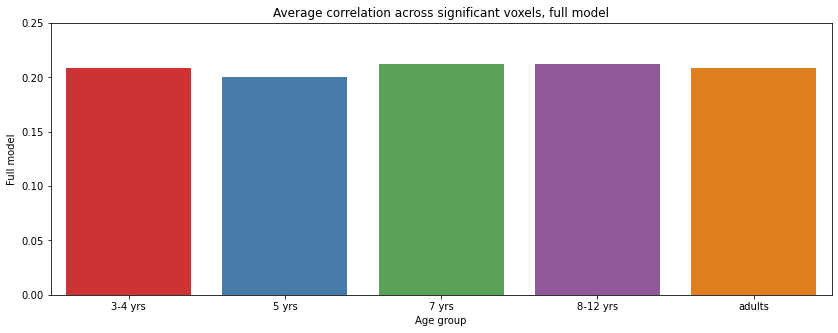

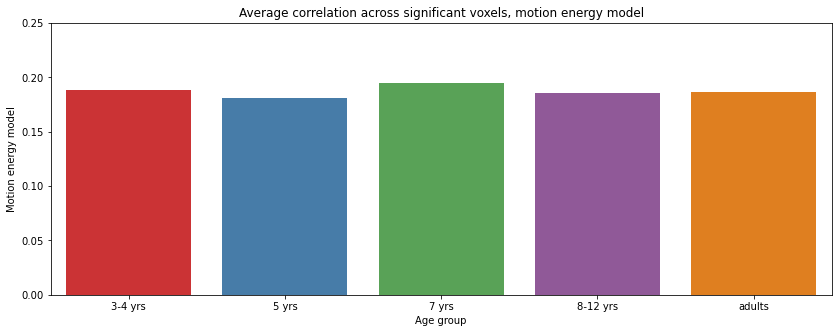

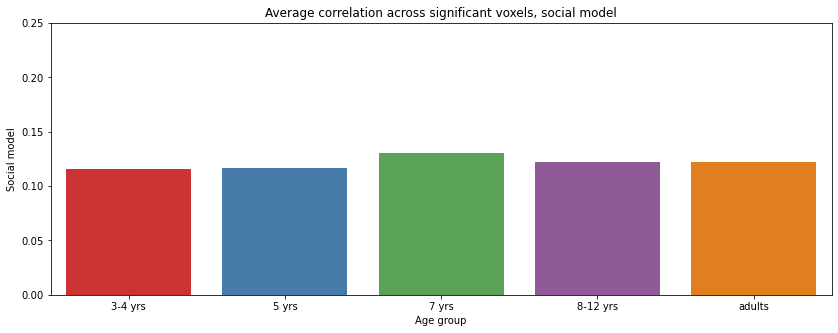

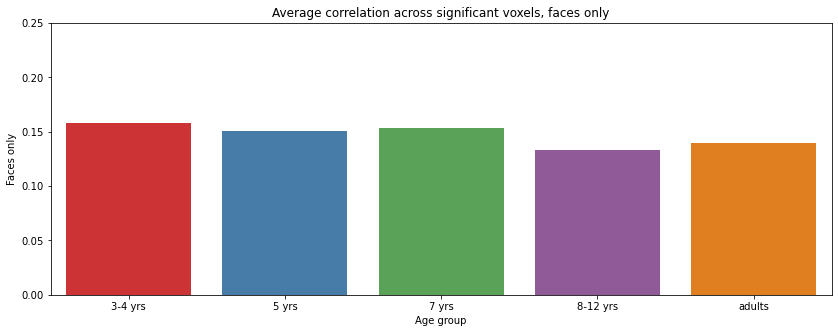

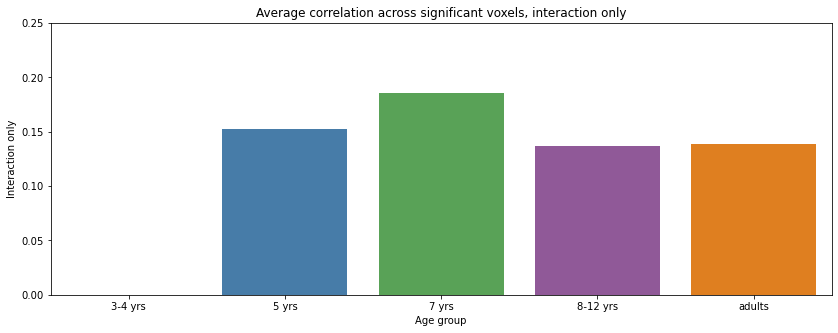

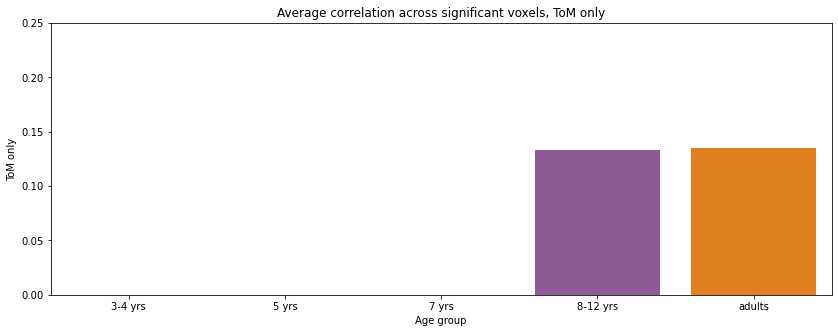

In [52]:
# Significance bar plots

fig = plt.figure(figsize=(14,5))
plt.title('Average correlation across significant voxels, full model')
ax = sns.barplot(data=avg_corr_df, x='Age group', y='Full model', palette="Set1")
ax.set_ylim((0, 0.25))
plt.show()

fig = plt.figure(figsize=(14,5))
plt.title('Average correlation across significant voxels, motion energy model')
ax = sns.barplot(data=avg_corr_df, x='Age group', y='Motion energy model', palette="Set1")
ax.set_ylim((0, 0.25))
plt.show()

fig = plt.figure(figsize=(14,5))
plt.title('Average correlation across significant voxels, social model')
ax = sns.barplot(data=avg_corr_df, x='Age group', y='Social model', palette="Set1")
ax.set_ylim((0, 0.25))
plt.show()

fig = plt.figure(figsize=(14,5))
plt.title('Average correlation across significant voxels, faces only')
ax = sns.barplot(data=avg_corr_df, x='Age group', y='Faces only', palette="Set1")
ax.set_ylim((0, 0.25))
plt.show()

fig = plt.figure(figsize=(14,5))
plt.title('Average correlation across significant voxels, interaction only')
ax = sns.barplot(data=avg_corr_df, x='Age group', y='Interaction only', palette="Set1")
ax.set_ylim((0, 0.25))
plt.show()

fig = plt.figure(figsize=(14,5))
plt.title('Average correlation across significant voxels, ToM only')
ax = sns.barplot(data=avg_corr_df, x='Age group', y='ToM only', palette="Set1")
ax.set_ylim((0, 0.25))
plt.show()